# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [25]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
#helper.download_extract('celeba', data_dir)

Found mnist Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

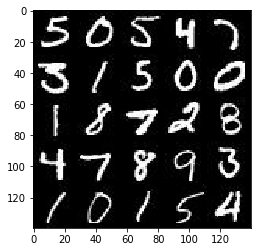

In [26]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

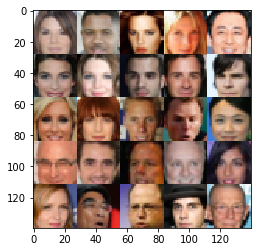

In [27]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [28]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [29]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real' )
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32)

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [30]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse = reuse):
        alpha = 0.1 #FIXME
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)
        
        return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [31]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not(is_train)):
        alpha = 0.1
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28xdim now
        
        output = tf.tanh(logits)
    
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [32]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [33]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [34]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [35]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    print_every = 10
    show_every = 50
    steps = 0
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images,
                                                     input_z: batch_z,
                                                     lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z,
                                                     input_real: batch_images,
                                                     lr: learning_rate})
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                    
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5436... Generator Loss: 1.5916
Epoch 1/2... Discriminator Loss: 1.3069... Generator Loss: 0.4694
Epoch 1/2... Discriminator Loss: 1.0300... Generator Loss: 1.1461
Epoch 1/2... Discriminator Loss: 1.0206... Generator Loss: 0.7464
Epoch 1/2... Discriminator Loss: 0.8489... Generator Loss: 1.1677


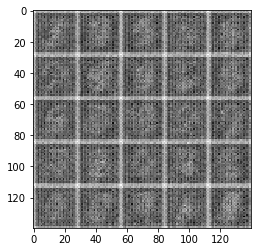

Epoch 1/2... Discriminator Loss: 0.8781... Generator Loss: 0.8249
Epoch 1/2... Discriminator Loss: 0.9043... Generator Loss: 0.7461
Epoch 1/2... Discriminator Loss: 0.7719... Generator Loss: 0.9140
Epoch 1/2... Discriminator Loss: 2.3685... Generator Loss: 0.1221
Epoch 1/2... Discriminator Loss: 0.7118... Generator Loss: 1.0223


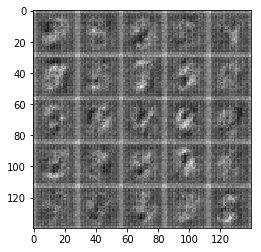

Epoch 1/2... Discriminator Loss: 0.5153... Generator Loss: 1.5765
Epoch 1/2... Discriminator Loss: 0.5361... Generator Loss: 2.2932
Epoch 1/2... Discriminator Loss: 0.5368... Generator Loss: 1.2038
Epoch 1/2... Discriminator Loss: 0.4905... Generator Loss: 1.9799
Epoch 1/2... Discriminator Loss: 0.3426... Generator Loss: 1.6321


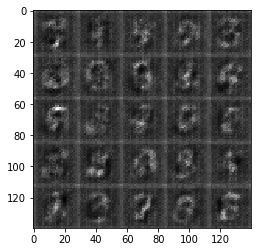

Epoch 1/2... Discriminator Loss: 0.3494... Generator Loss: 1.6377
Epoch 1/2... Discriminator Loss: 0.2697... Generator Loss: 1.9363
Epoch 1/2... Discriminator Loss: 0.2550... Generator Loss: 1.9645
Epoch 1/2... Discriminator Loss: 0.2401... Generator Loss: 2.8708
Epoch 1/2... Discriminator Loss: 0.1419... Generator Loss: 2.5144


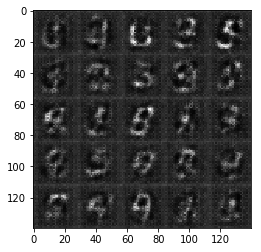

Epoch 1/2... Discriminator Loss: 0.1391... Generator Loss: 2.9998
Epoch 1/2... Discriminator Loss: 0.1320... Generator Loss: 2.6801
Epoch 1/2... Discriminator Loss: 0.0433... Generator Loss: 4.3956
Epoch 1/2... Discriminator Loss: 0.1021... Generator Loss: 3.5079
Epoch 1/2... Discriminator Loss: 0.1520... Generator Loss: 3.9020


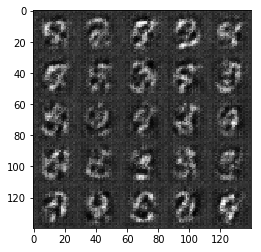

Epoch 1/2... Discriminator Loss: 0.1273... Generator Loss: 3.2691
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 0.7743
Epoch 1/2... Discriminator Loss: 0.1361... Generator Loss: 3.1518
Epoch 1/2... Discriminator Loss: 0.1179... Generator Loss: 4.1935
Epoch 1/2... Discriminator Loss: 1.5262... Generator Loss: 6.5689


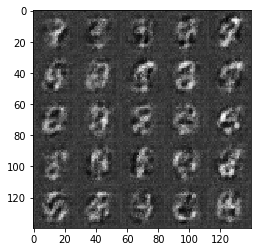

Epoch 1/2... Discriminator Loss: 0.5297... Generator Loss: 1.3384
Epoch 1/2... Discriminator Loss: 0.1945... Generator Loss: 2.9908
Epoch 1/2... Discriminator Loss: 0.1454... Generator Loss: 2.5642
Epoch 1/2... Discriminator Loss: 0.3615... Generator Loss: 1.5204
Epoch 1/2... Discriminator Loss: 0.2236... Generator Loss: 2.1200


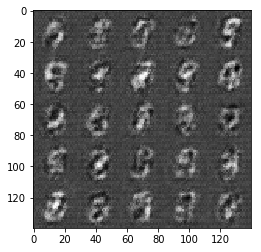

Epoch 1/2... Discriminator Loss: 0.1677... Generator Loss: 2.4848
Epoch 1/2... Discriminator Loss: 0.2485... Generator Loss: 1.9790
Epoch 1/2... Discriminator Loss: 0.1040... Generator Loss: 3.0418
Epoch 1/2... Discriminator Loss: 0.1691... Generator Loss: 2.5500
Epoch 1/2... Discriminator Loss: 0.1811... Generator Loss: 2.4564


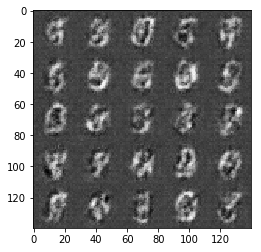

Epoch 1/2... Discriminator Loss: 0.1161... Generator Loss: 3.6272
Epoch 1/2... Discriminator Loss: 0.1518... Generator Loss: 2.5582
Epoch 1/2... Discriminator Loss: 0.6215... Generator Loss: 0.9061
Epoch 1/2... Discriminator Loss: 0.1241... Generator Loss: 3.0721
Epoch 1/2... Discriminator Loss: 0.1345... Generator Loss: 3.2807


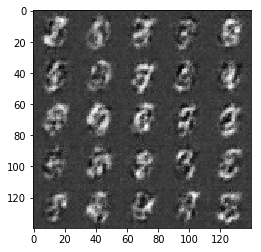

Epoch 1/2... Discriminator Loss: 0.3093... Generator Loss: 1.7176
Epoch 1/2... Discriminator Loss: 0.0956... Generator Loss: 3.6265
Epoch 1/2... Discriminator Loss: 0.1085... Generator Loss: 2.8236
Epoch 1/2... Discriminator Loss: 0.1463... Generator Loss: 2.5908


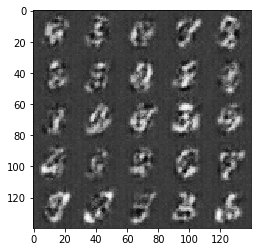

Epoch 1/2... Discriminator Loss: 1.7050... Generator Loss: 7.3788
Epoch 1/2... Discriminator Loss: 0.3560... Generator Loss: 1.6077
Epoch 1/2... Discriminator Loss: 0.1260... Generator Loss: 3.0257
Epoch 1/2... Discriminator Loss: 0.1866... Generator Loss: 2.3447
Epoch 1/2... Discriminator Loss: 0.1217... Generator Loss: 2.5143


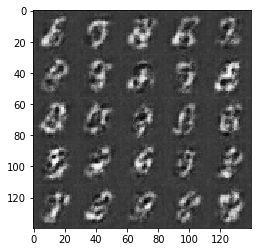

Epoch 1/2... Discriminator Loss: 0.1319... Generator Loss: 2.8432
Epoch 1/2... Discriminator Loss: 0.1713... Generator Loss: 2.5243
Epoch 1/2... Discriminator Loss: 0.1266... Generator Loss: 2.6677
Epoch 1/2... Discriminator Loss: 0.1293... Generator Loss: 2.9446
Epoch 1/2... Discriminator Loss: 0.1290... Generator Loss: 2.9189


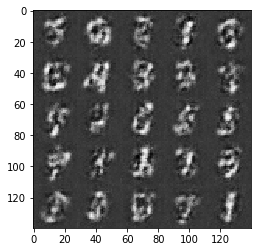

Epoch 1/2... Discriminator Loss: 0.0831... Generator Loss: 3.0997
Epoch 1/2... Discriminator Loss: 0.1056... Generator Loss: 3.1028
Epoch 1/2... Discriminator Loss: 0.1828... Generator Loss: 2.1979
Epoch 1/2... Discriminator Loss: 0.0980... Generator Loss: 3.7687
Epoch 1/2... Discriminator Loss: 0.1005... Generator Loss: 2.8138


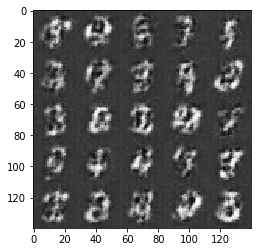

Epoch 1/2... Discriminator Loss: 0.1008... Generator Loss: 3.0133
Epoch 1/2... Discriminator Loss: 0.0781... Generator Loss: 3.7302
Epoch 1/2... Discriminator Loss: 0.0995... Generator Loss: 3.3161
Epoch 1/2... Discriminator Loss: 0.1578... Generator Loss: 2.5761
Epoch 1/2... Discriminator Loss: 0.0802... Generator Loss: 3.4626


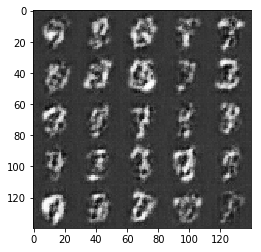

Epoch 1/2... Discriminator Loss: 0.1098... Generator Loss: 3.1593
Epoch 1/2... Discriminator Loss: 0.1230... Generator Loss: 2.5639
Epoch 1/2... Discriminator Loss: 0.1051... Generator Loss: 2.9112
Epoch 1/2... Discriminator Loss: 0.1203... Generator Loss: 3.2130
Epoch 1/2... Discriminator Loss: 0.1074... Generator Loss: 2.9019


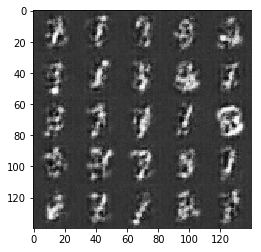

Epoch 1/2... Discriminator Loss: 0.1353... Generator Loss: 3.7255
Epoch 1/2... Discriminator Loss: 0.0875... Generator Loss: 3.1985
Epoch 1/2... Discriminator Loss: 0.2681... Generator Loss: 1.7965
Epoch 1/2... Discriminator Loss: 2.7525... Generator Loss: 9.7437
Epoch 1/2... Discriminator Loss: 0.2209... Generator Loss: 2.4621


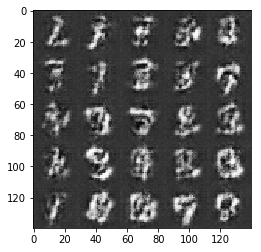

Epoch 1/2... Discriminator Loss: 0.2131... Generator Loss: 2.2642
Epoch 1/2... Discriminator Loss: 0.1247... Generator Loss: 2.6440
Epoch 1/2... Discriminator Loss: 0.0900... Generator Loss: 3.0398
Epoch 1/2... Discriminator Loss: 0.1338... Generator Loss: 2.7243
Epoch 1/2... Discriminator Loss: 0.1069... Generator Loss: 2.7071


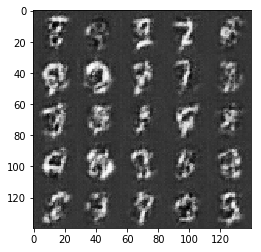

Epoch 1/2... Discriminator Loss: 0.0857... Generator Loss: 3.0984
Epoch 1/2... Discriminator Loss: 0.1986... Generator Loss: 2.1763
Epoch 1/2... Discriminator Loss: 0.0964... Generator Loss: 2.7797
Epoch 1/2... Discriminator Loss: 0.0740... Generator Loss: 3.3668
Epoch 1/2... Discriminator Loss: 0.0879... Generator Loss: 3.3926


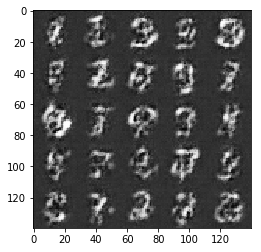

Epoch 1/2... Discriminator Loss: 0.0798... Generator Loss: 3.2669
Epoch 1/2... Discriminator Loss: 0.0813... Generator Loss: 3.1946
Epoch 1/2... Discriminator Loss: 0.0798... Generator Loss: 2.9498
Epoch 1/2... Discriminator Loss: 0.1228... Generator Loss: 2.7026
Epoch 1/2... Discriminator Loss: 0.1414... Generator Loss: 2.4342


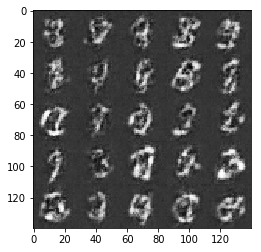

Epoch 1/2... Discriminator Loss: 0.0933... Generator Loss: 3.1923
Epoch 1/2... Discriminator Loss: 0.0622... Generator Loss: 3.7044
Epoch 1/2... Discriminator Loss: 0.0472... Generator Loss: 3.7257
Epoch 1/2... Discriminator Loss: 0.0639... Generator Loss: 3.6722
Epoch 1/2... Discriminator Loss: 0.0870... Generator Loss: 2.9820


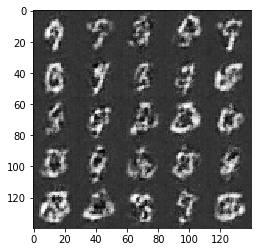

Epoch 1/2... Discriminator Loss: 0.0924... Generator Loss: 2.9745
Epoch 1/2... Discriminator Loss: 0.0381... Generator Loss: 3.8738
Epoch 1/2... Discriminator Loss: 0.0507... Generator Loss: 3.7942
Epoch 1/2... Discriminator Loss: 0.0531... Generator Loss: 3.6151
Epoch 1/2... Discriminator Loss: 0.0345... Generator Loss: 3.9667


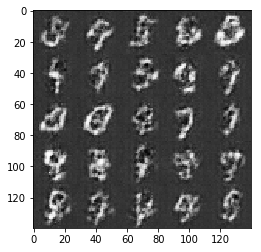

Epoch 1/2... Discriminator Loss: 0.0219... Generator Loss: 4.6267
Epoch 1/2... Discriminator Loss: 0.0903... Generator Loss: 3.0661
Epoch 1/2... Discriminator Loss: 0.0492... Generator Loss: 3.6201
Epoch 1/2... Discriminator Loss: 0.0431... Generator Loss: 3.7616
Epoch 1/2... Discriminator Loss: 0.1266... Generator Loss: 2.5388


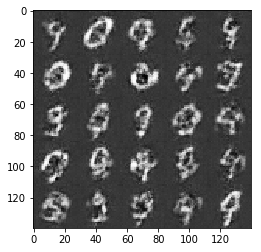

Epoch 1/2... Discriminator Loss: 0.0415... Generator Loss: 3.7665
Epoch 1/2... Discriminator Loss: 0.0803... Generator Loss: 3.0771
Epoch 1/2... Discriminator Loss: 0.0377... Generator Loss: 5.2083
Epoch 1/2... Discriminator Loss: 0.1873... Generator Loss: 6.1933
Epoch 1/2... Discriminator Loss: 0.2618... Generator Loss: 2.0092


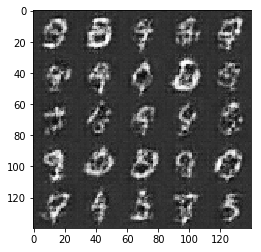

Epoch 1/2... Discriminator Loss: 0.1436... Generator Loss: 2.5196
Epoch 1/2... Discriminator Loss: 0.0788... Generator Loss: 3.2457
Epoch 1/2... Discriminator Loss: 0.1094... Generator Loss: 2.7574
Epoch 1/2... Discriminator Loss: 0.1054... Generator Loss: 2.7743
Epoch 1/2... Discriminator Loss: 0.0901... Generator Loss: 3.1606


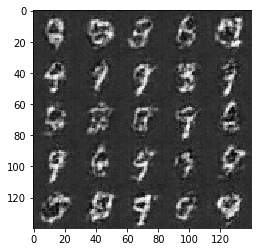

Epoch 1/2... Discriminator Loss: 0.0479... Generator Loss: 4.0598
Epoch 1/2... Discriminator Loss: 0.1281... Generator Loss: 2.5982
Epoch 1/2... Discriminator Loss: 0.0670... Generator Loss: 3.4196
Epoch 1/2... Discriminator Loss: 0.0446... Generator Loss: 3.5791
Epoch 1/2... Discriminator Loss: 0.0601... Generator Loss: 3.3071


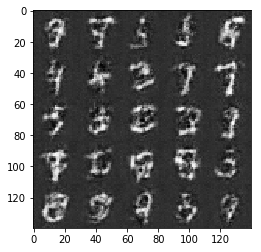

Epoch 1/2... Discriminator Loss: 0.0801... Generator Loss: 3.1507
Epoch 1/2... Discriminator Loss: 0.0953... Generator Loss: 2.8528
Epoch 1/2... Discriminator Loss: 0.1031... Generator Loss: 2.8294
Epoch 1/2... Discriminator Loss: 0.0834... Generator Loss: 3.0897
Epoch 1/2... Discriminator Loss: 0.0616... Generator Loss: 3.4566


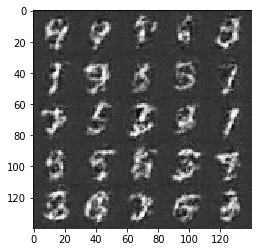

Epoch 1/2... Discriminator Loss: 0.1208... Generator Loss: 2.8669
Epoch 1/2... Discriminator Loss: 0.0428... Generator Loss: 3.8601
Epoch 1/2... Discriminator Loss: 0.1255... Generator Loss: 2.8314
Epoch 1/2... Discriminator Loss: 0.0214... Generator Loss: 4.8519
Epoch 1/2... Discriminator Loss: 0.0330... Generator Loss: 4.2369


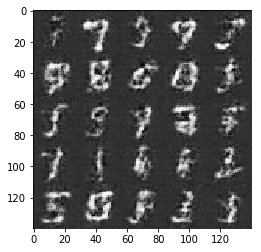

Epoch 1/2... Discriminator Loss: 0.1229... Generator Loss: 2.6092
Epoch 1/2... Discriminator Loss: 0.0513... Generator Loss: 3.8148
Epoch 1/2... Discriminator Loss: 0.0767... Generator Loss: 3.2588
Epoch 1/2... Discriminator Loss: 0.0324... Generator Loss: 4.7106
Epoch 1/2... Discriminator Loss: 0.0502... Generator Loss: 3.7695


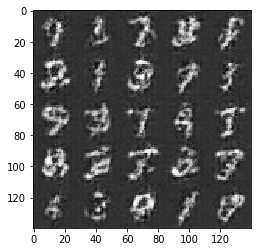

Epoch 1/2... Discriminator Loss: 0.0180... Generator Loss: 5.1342
Epoch 1/2... Discriminator Loss: 0.0267... Generator Loss: 4.1751
Epoch 1/2... Discriminator Loss: 0.0735... Generator Loss: 3.1283
Epoch 1/2... Discriminator Loss: 0.0358... Generator Loss: 3.9546
Epoch 1/2... Discriminator Loss: 0.0693... Generator Loss: 3.2748


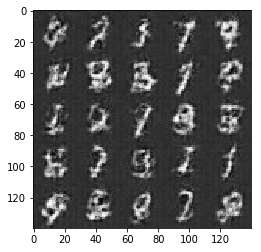

Epoch 1/2... Discriminator Loss: 0.0561... Generator Loss: 3.6631
Epoch 1/2... Discriminator Loss: 0.0310... Generator Loss: 4.1891
Epoch 1/2... Discriminator Loss: 0.0581... Generator Loss: 3.4638
Epoch 1/2... Discriminator Loss: 0.0258... Generator Loss: 4.3354
Epoch 1/2... Discriminator Loss: 0.0358... Generator Loss: 4.2987


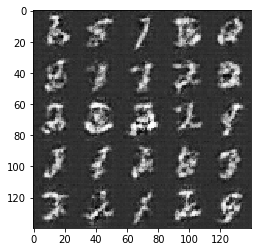

Epoch 1/2... Discriminator Loss: 0.0702... Generator Loss: 3.1892
Epoch 1/2... Discriminator Loss: 0.0654... Generator Loss: 3.1677
Epoch 1/2... Discriminator Loss: 0.0376... Generator Loss: 3.9255
Epoch 1/2... Discriminator Loss: 0.0680... Generator Loss: 3.4354
Epoch 1/2... Discriminator Loss: 0.0386... Generator Loss: 4.7265


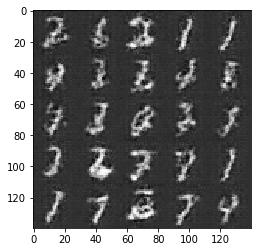

Epoch 1/2... Discriminator Loss: 0.0438... Generator Loss: 3.6329
Epoch 1/2... Discriminator Loss: 0.0599... Generator Loss: 3.3055
Epoch 1/2... Discriminator Loss: 0.0378... Generator Loss: 4.0383
Epoch 1/2... Discriminator Loss: 0.0252... Generator Loss: 4.5278
Epoch 1/2... Discriminator Loss: 0.0220... Generator Loss: 4.9759


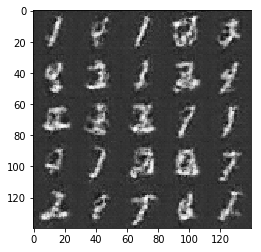

Epoch 1/2... Discriminator Loss: 0.0300... Generator Loss: 4.6016
Epoch 1/2... Discriminator Loss: 0.0879... Generator Loss: 3.3252
Epoch 1/2... Discriminator Loss: 0.1532... Generator Loss: 2.3320
Epoch 1/2... Discriminator Loss: 0.4493... Generator Loss: 3.2436
Epoch 1/2... Discriminator Loss: 0.3237... Generator Loss: 2.2741


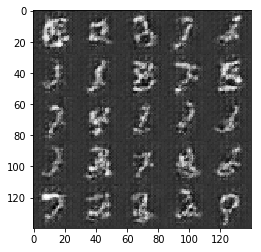

Epoch 1/2... Discriminator Loss: 0.3345... Generator Loss: 1.6991
Epoch 1/2... Discriminator Loss: 0.1783... Generator Loss: 2.2929
Epoch 1/2... Discriminator Loss: 0.1327... Generator Loss: 2.9721
Epoch 1/2... Discriminator Loss: 0.2346... Generator Loss: 1.9577
Epoch 1/2... Discriminator Loss: 0.1351... Generator Loss: 2.7331


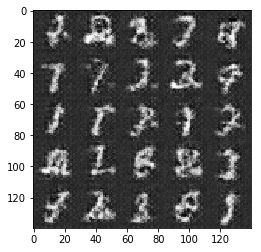

Epoch 1/2... Discriminator Loss: 0.1786... Generator Loss: 2.3998
Epoch 1/2... Discriminator Loss: 0.2143... Generator Loss: 1.9833
Epoch 1/2... Discriminator Loss: 0.1389... Generator Loss: 2.8185
Epoch 1/2... Discriminator Loss: 0.0962... Generator Loss: 3.1304
Epoch 1/2... Discriminator Loss: 0.1401... Generator Loss: 2.4625


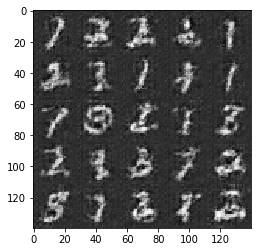

Epoch 1/2... Discriminator Loss: 0.0850... Generator Loss: 3.0465
Epoch 1/2... Discriminator Loss: 0.2228... Generator Loss: 2.0875
Epoch 1/2... Discriminator Loss: 0.1195... Generator Loss: 2.6182
Epoch 1/2... Discriminator Loss: 0.1277... Generator Loss: 2.3486
Epoch 1/2... Discriminator Loss: 0.1053... Generator Loss: 2.7777


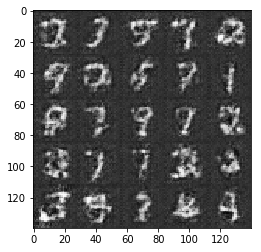

Epoch 1/2... Discriminator Loss: 0.1317... Generator Loss: 2.8199
Epoch 1/2... Discriminator Loss: 0.2594... Generator Loss: 1.9880
Epoch 2/2... Discriminator Loss: 0.1970... Generator Loss: 2.1393
Epoch 2/2... Discriminator Loss: 0.0868... Generator Loss: 2.8105
Epoch 2/2... Discriminator Loss: 0.2353... Generator Loss: 2.0885
Epoch 2/2... Discriminator Loss: 0.3758... Generator Loss: 1.4914


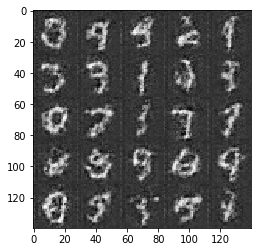

Epoch 2/2... Discriminator Loss: 0.2435... Generator Loss: 1.8148
Epoch 2/2... Discriminator Loss: 0.0516... Generator Loss: 3.7273
Epoch 2/2... Discriminator Loss: 0.1618... Generator Loss: 2.3392
Epoch 2/2... Discriminator Loss: 0.0994... Generator Loss: 2.7325
Epoch 2/2... Discriminator Loss: 0.2836... Generator Loss: 1.8494


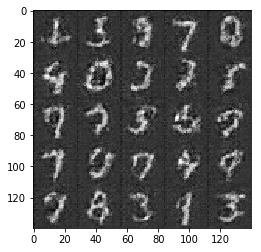

Epoch 2/2... Discriminator Loss: 0.2199... Generator Loss: 2.0162
Epoch 2/2... Discriminator Loss: 0.1966... Generator Loss: 2.0492
Epoch 2/2... Discriminator Loss: 0.5462... Generator Loss: 1.1606
Epoch 2/2... Discriminator Loss: 0.1520... Generator Loss: 2.2875
Epoch 2/2... Discriminator Loss: 0.0537... Generator Loss: 3.9893


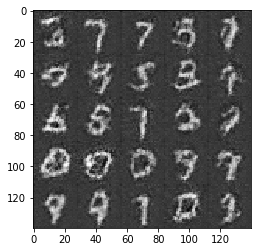

Epoch 2/2... Discriminator Loss: 0.4095... Generator Loss: 1.4083
Epoch 2/2... Discriminator Loss: 0.2522... Generator Loss: 1.8359
Epoch 2/2... Discriminator Loss: 0.1942... Generator Loss: 2.2970
Epoch 2/2... Discriminator Loss: 0.1189... Generator Loss: 2.8261
Epoch 2/2... Discriminator Loss: 0.1677... Generator Loss: 2.3179


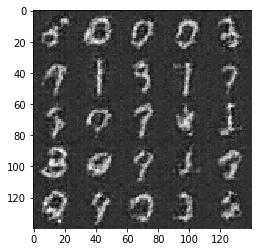

Epoch 2/2... Discriminator Loss: 0.0643... Generator Loss: 3.7203
Epoch 2/2... Discriminator Loss: 0.0672... Generator Loss: 3.3106
Epoch 2/2... Discriminator Loss: 0.2975... Generator Loss: 1.8011
Epoch 2/2... Discriminator Loss: 0.1320... Generator Loss: 2.5390
Epoch 2/2... Discriminator Loss: 0.1851... Generator Loss: 2.2129


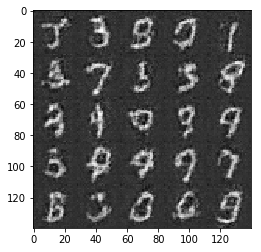

Epoch 2/2... Discriminator Loss: 2.1858... Generator Loss: 0.1792
Epoch 2/2... Discriminator Loss: 0.5842... Generator Loss: 1.3450
Epoch 2/2... Discriminator Loss: 0.2004... Generator Loss: 2.2930
Epoch 2/2... Discriminator Loss: 0.1472... Generator Loss: 2.6949
Epoch 2/2... Discriminator Loss: 0.1686... Generator Loss: 2.4186


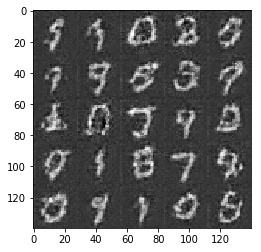

Epoch 2/2... Discriminator Loss: 0.2956... Generator Loss: 1.6576
Epoch 2/2... Discriminator Loss: 0.2500... Generator Loss: 1.8960
Epoch 2/2... Discriminator Loss: 0.2683... Generator Loss: 1.9502
Epoch 2/2... Discriminator Loss: 0.2526... Generator Loss: 1.8039
Epoch 2/2... Discriminator Loss: 0.1185... Generator Loss: 2.6440


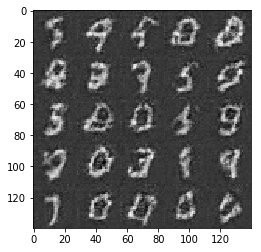

Epoch 2/2... Discriminator Loss: 0.1702... Generator Loss: 2.2267
Epoch 2/2... Discriminator Loss: 0.2167... Generator Loss: 1.9586
Epoch 2/2... Discriminator Loss: 0.0779... Generator Loss: 3.0055
Epoch 2/2... Discriminator Loss: 0.3190... Generator Loss: 1.6928
Epoch 2/2... Discriminator Loss: 0.3353... Generator Loss: 1.6433


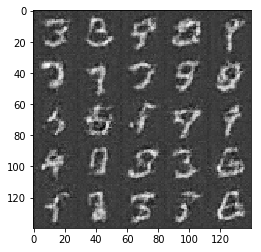

Epoch 2/2... Discriminator Loss: 0.1800... Generator Loss: 2.3479
Epoch 2/2... Discriminator Loss: 0.1651... Generator Loss: 2.3617
Epoch 2/2... Discriminator Loss: 0.1682... Generator Loss: 2.1550
Epoch 2/2... Discriminator Loss: 0.1069... Generator Loss: 2.7022
Epoch 2/2... Discriminator Loss: 0.2488... Generator Loss: 2.0134


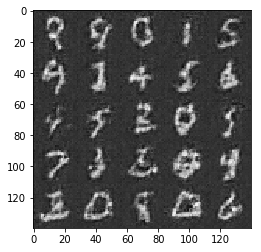

Epoch 2/2... Discriminator Loss: 0.1280... Generator Loss: 2.8110
Epoch 2/2... Discriminator Loss: 0.1065... Generator Loss: 2.8632
Epoch 2/2... Discriminator Loss: 0.1895... Generator Loss: 2.4486
Epoch 2/2... Discriminator Loss: 0.1219... Generator Loss: 2.8174
Epoch 2/2... Discriminator Loss: 0.1763... Generator Loss: 2.2518


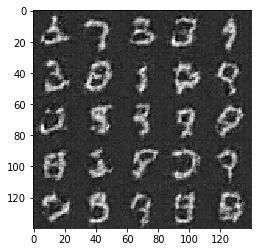

Epoch 2/2... Discriminator Loss: 0.0539... Generator Loss: 3.5830
Epoch 2/2... Discriminator Loss: 0.3694... Generator Loss: 1.5298
Epoch 2/2... Discriminator Loss: 0.0817... Generator Loss: 3.0092
Epoch 2/2... Discriminator Loss: 0.1185... Generator Loss: 2.8216
Epoch 2/2... Discriminator Loss: 0.1764... Generator Loss: 2.1458


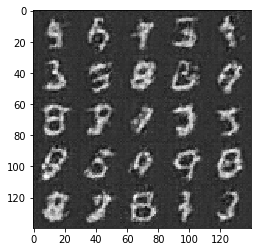

Epoch 2/2... Discriminator Loss: 0.1582... Generator Loss: 2.4225
Epoch 2/2... Discriminator Loss: 0.0788... Generator Loss: 3.1831
Epoch 2/2... Discriminator Loss: 0.0705... Generator Loss: 3.0791
Epoch 2/2... Discriminator Loss: 0.1127... Generator Loss: 2.6719
Epoch 2/2... Discriminator Loss: 0.1135... Generator Loss: 2.8324


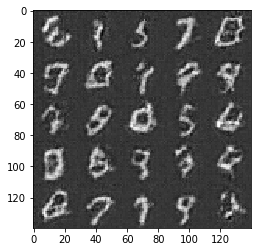

Epoch 2/2... Discriminator Loss: 0.0475... Generator Loss: 4.2154
Epoch 2/2... Discriminator Loss: 1.1198... Generator Loss: 0.6316
Epoch 2/2... Discriminator Loss: 0.7358... Generator Loss: 4.4766
Epoch 2/2... Discriminator Loss: 0.2508... Generator Loss: 2.2994
Epoch 2/2... Discriminator Loss: 0.1505... Generator Loss: 2.7427


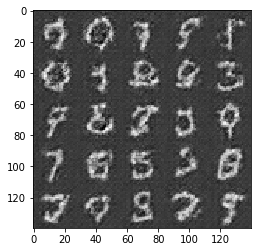

Epoch 2/2... Discriminator Loss: 0.2102... Generator Loss: 2.0272
Epoch 2/2... Discriminator Loss: 0.1899... Generator Loss: 2.0830
Epoch 2/2... Discriminator Loss: 0.2087... Generator Loss: 2.0447
Epoch 2/2... Discriminator Loss: 0.1644... Generator Loss: 2.4429
Epoch 2/2... Discriminator Loss: 0.2351... Generator Loss: 1.8753


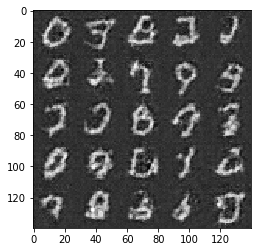

Epoch 2/2... Discriminator Loss: 0.2957... Generator Loss: 1.7532
Epoch 2/2... Discriminator Loss: 0.2350... Generator Loss: 1.9671
Epoch 2/2... Discriminator Loss: 0.2287... Generator Loss: 1.9248
Epoch 2/2... Discriminator Loss: 0.2282... Generator Loss: 1.9613
Epoch 2/2... Discriminator Loss: 0.2666... Generator Loss: 1.6963


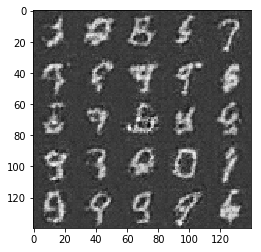

Epoch 2/2... Discriminator Loss: 0.1027... Generator Loss: 2.6118
Epoch 2/2... Discriminator Loss: 0.1289... Generator Loss: 2.6997
Epoch 2/2... Discriminator Loss: 0.1565... Generator Loss: 2.2477
Epoch 2/2... Discriminator Loss: 0.0973... Generator Loss: 2.7988
Epoch 2/2... Discriminator Loss: 0.0673... Generator Loss: 3.3556


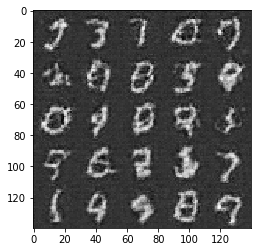

Epoch 2/2... Discriminator Loss: 0.1002... Generator Loss: 2.8613
Epoch 2/2... Discriminator Loss: 0.1624... Generator Loss: 2.2825
Epoch 2/2... Discriminator Loss: 0.1987... Generator Loss: 2.0652
Epoch 2/2... Discriminator Loss: 0.3081... Generator Loss: 2.0798
Epoch 2/2... Discriminator Loss: 0.1533... Generator Loss: 2.3554


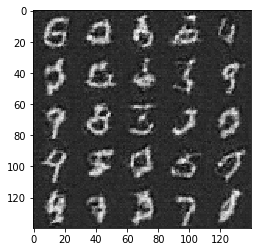

Epoch 2/2... Discriminator Loss: 0.1737... Generator Loss: 2.3198
Epoch 2/2... Discriminator Loss: 0.3532... Generator Loss: 1.6052
Epoch 2/2... Discriminator Loss: 0.0760... Generator Loss: 3.1655
Epoch 2/2... Discriminator Loss: 0.1627... Generator Loss: 2.2457
Epoch 2/2... Discriminator Loss: 0.1807... Generator Loss: 2.1081


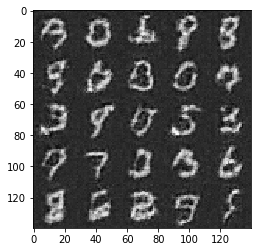

Epoch 2/2... Discriminator Loss: 0.3008... Generator Loss: 1.5738
Epoch 2/2... Discriminator Loss: 0.2703... Generator Loss: 1.8515
Epoch 2/2... Discriminator Loss: 0.2576... Generator Loss: 1.9029
Epoch 2/2... Discriminator Loss: 0.2236... Generator Loss: 2.0592
Epoch 2/2... Discriminator Loss: 0.1358... Generator Loss: 2.4193


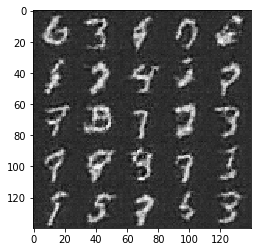

Epoch 2/2... Discriminator Loss: 0.2304... Generator Loss: 1.8509
Epoch 2/2... Discriminator Loss: 0.1448... Generator Loss: 2.4066
Epoch 2/2... Discriminator Loss: 0.2511... Generator Loss: 1.8733
Epoch 2/2... Discriminator Loss: 0.3352... Generator Loss: 1.6457
Epoch 2/2... Discriminator Loss: 0.0198... Generator Loss: 4.7996


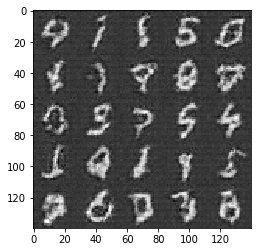

Epoch 2/2... Discriminator Loss: 0.0529... Generator Loss: 4.2535
Epoch 2/2... Discriminator Loss: 0.1403... Generator Loss: 2.4187
Epoch 2/2... Discriminator Loss: 0.3788... Generator Loss: 1.6867
Epoch 2/2... Discriminator Loss: 0.0829... Generator Loss: 2.9034
Epoch 2/2... Discriminator Loss: 0.0782... Generator Loss: 3.1676


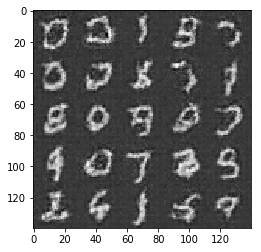

Epoch 2/2... Discriminator Loss: 0.0814... Generator Loss: 3.1642
Epoch 2/2... Discriminator Loss: 0.0529... Generator Loss: 3.4935
Epoch 2/2... Discriminator Loss: 0.1895... Generator Loss: 2.4742
Epoch 2/2... Discriminator Loss: 0.1527... Generator Loss: 2.8318
Epoch 2/2... Discriminator Loss: 0.1665... Generator Loss: 2.2490


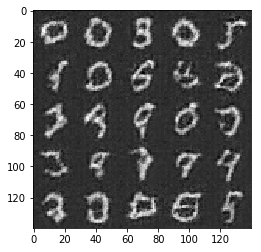

Epoch 2/2... Discriminator Loss: 0.0381... Generator Loss: 3.7368
Epoch 2/2... Discriminator Loss: 0.0908... Generator Loss: 3.0142
Epoch 2/2... Discriminator Loss: 0.1099... Generator Loss: 2.8233
Epoch 2/2... Discriminator Loss: 0.2206... Generator Loss: 1.8685
Epoch 2/2... Discriminator Loss: 0.0331... Generator Loss: 4.0813


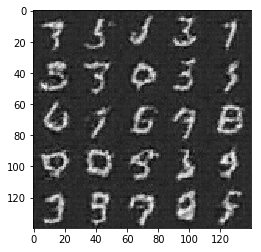

Epoch 2/2... Discriminator Loss: 0.0872... Generator Loss: 2.8566
Epoch 2/2... Discriminator Loss: 0.0692... Generator Loss: 3.2452
Epoch 2/2... Discriminator Loss: 0.1028... Generator Loss: 2.9532
Epoch 2/2... Discriminator Loss: 0.1601... Generator Loss: 2.3173
Epoch 2/2... Discriminator Loss: 0.0633... Generator Loss: 3.2763


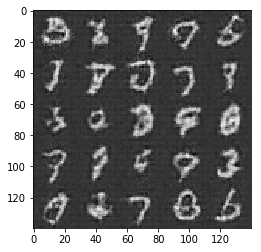

Epoch 2/2... Discriminator Loss: 0.0342... Generator Loss: 5.9756
Epoch 2/2... Discriminator Loss: 0.0972... Generator Loss: 2.8659
Epoch 2/2... Discriminator Loss: 0.2492... Generator Loss: 1.7800
Epoch 2/2... Discriminator Loss: 0.2182... Generator Loss: 2.1486
Epoch 2/2... Discriminator Loss: 0.1769... Generator Loss: 2.2308


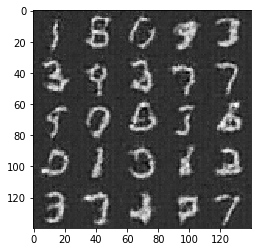

Epoch 2/2... Discriminator Loss: 0.0359... Generator Loss: 4.1960
Epoch 2/2... Discriminator Loss: 0.1648... Generator Loss: 2.2031
Epoch 2/2... Discriminator Loss: 0.0930... Generator Loss: 3.0206
Epoch 2/2... Discriminator Loss: 0.0420... Generator Loss: 3.8944
Epoch 2/2... Discriminator Loss: 0.0803... Generator Loss: 3.3765


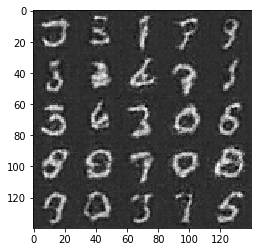

Epoch 2/2... Discriminator Loss: 0.0291... Generator Loss: 4.5333
Epoch 2/2... Discriminator Loss: 0.0567... Generator Loss: 3.4414
Epoch 2/2... Discriminator Loss: 0.0129... Generator Loss: 7.0019
Epoch 2/2... Discriminator Loss: 5.8267... Generator Loss: 0.0128
Epoch 2/2... Discriminator Loss: 0.8245... Generator Loss: 1.3761


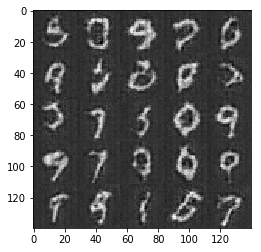

Epoch 2/2... Discriminator Loss: 0.9550... Generator Loss: 1.1951
Epoch 2/2... Discriminator Loss: 0.8378... Generator Loss: 1.1977
Epoch 2/2... Discriminator Loss: 0.8169... Generator Loss: 0.9072
Epoch 2/2... Discriminator Loss: 0.4975... Generator Loss: 2.0735
Epoch 2/2... Discriminator Loss: 0.4790... Generator Loss: 1.3366


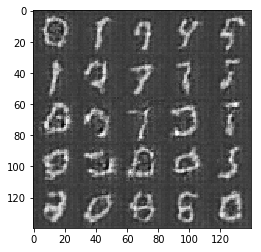

Epoch 2/2... Discriminator Loss: 0.5274... Generator Loss: 1.3105
Epoch 2/2... Discriminator Loss: 0.3768... Generator Loss: 1.7686
Epoch 2/2... Discriminator Loss: 0.4048... Generator Loss: 1.7873
Epoch 2/2... Discriminator Loss: 0.4698... Generator Loss: 2.2408
Epoch 2/2... Discriminator Loss: 0.4156... Generator Loss: 2.0458


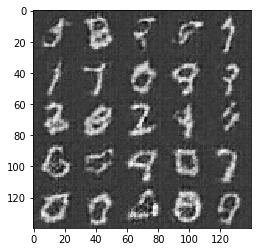

Epoch 2/2... Discriminator Loss: 0.2459... Generator Loss: 2.4442
Epoch 2/2... Discriminator Loss: 0.2893... Generator Loss: 1.8747
Epoch 2/2... Discriminator Loss: 0.3279... Generator Loss: 1.5769
Epoch 2/2... Discriminator Loss: 0.2526... Generator Loss: 2.1169
Epoch 2/2... Discriminator Loss: 0.1887... Generator Loss: 3.2336


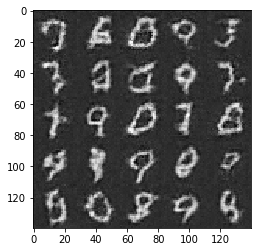

Epoch 2/2... Discriminator Loss: 0.1931... Generator Loss: 2.3696
Epoch 2/2... Discriminator Loss: 0.1577... Generator Loss: 2.4570
Epoch 2/2... Discriminator Loss: 0.2139... Generator Loss: 2.4351
Epoch 2/2... Discriminator Loss: 0.0970... Generator Loss: 3.1040
Epoch 2/2... Discriminator Loss: 0.0690... Generator Loss: 3.3241


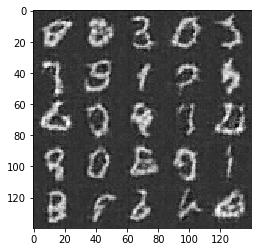

Epoch 2/2... Discriminator Loss: 0.1227... Generator Loss: 2.9779
Epoch 2/2... Discriminator Loss: 0.1594... Generator Loss: 2.3062
Epoch 2/2... Discriminator Loss: 0.0802... Generator Loss: 3.1157
Epoch 2/2... Discriminator Loss: 0.1649... Generator Loss: 2.3648
Epoch 2/2... Discriminator Loss: 0.1146... Generator Loss: 2.9399


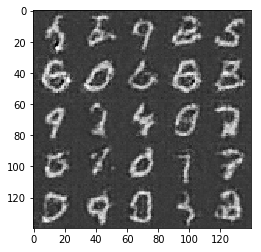

Epoch 2/2... Discriminator Loss: 0.1834... Generator Loss: 2.3659
Epoch 2/2... Discriminator Loss: 0.2936... Generator Loss: 1.7733
Epoch 2/2... Discriminator Loss: 0.1604... Generator Loss: 2.4229
Epoch 2/2... Discriminator Loss: 0.1735... Generator Loss: 2.1702
Epoch 2/2... Discriminator Loss: 0.0575... Generator Loss: 3.4711


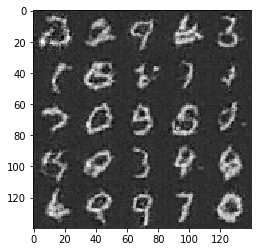

Epoch 2/2... Discriminator Loss: 0.0815... Generator Loss: 3.1342
Epoch 2/2... Discriminator Loss: 0.1319... Generator Loss: 2.7113
Epoch 2/2... Discriminator Loss: 0.0288... Generator Loss: 4.9091
Epoch 2/2... Discriminator Loss: 0.0847... Generator Loss: 2.9830
Epoch 2/2... Discriminator Loss: 0.1606... Generator Loss: 2.2409


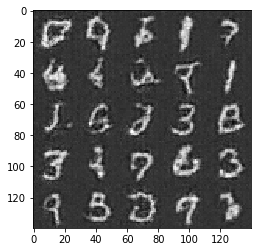

Epoch 2/2... Discriminator Loss: 0.0392... Generator Loss: 3.6500
Epoch 2/2... Discriminator Loss: 0.0908... Generator Loss: 3.2459
Epoch 2/2... Discriminator Loss: 0.1222... Generator Loss: 2.8044
Epoch 2/2... Discriminator Loss: 0.0872... Generator Loss: 3.3483
Epoch 2/2... Discriminator Loss: 0.0405... Generator Loss: 4.1268


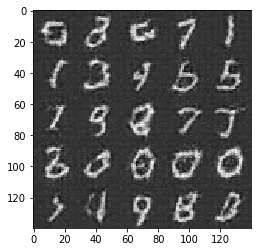

Epoch 2/2... Discriminator Loss: 0.0531... Generator Loss: 3.5024
Epoch 2/2... Discriminator Loss: 0.0155... Generator Loss: 4.9681
Epoch 2/2... Discriminator Loss: 0.1001... Generator Loss: 2.7313
Epoch 2/2... Discriminator Loss: 0.0295... Generator Loss: 4.1911
Epoch 2/2... Discriminator Loss: 0.0956... Generator Loss: 3.1345


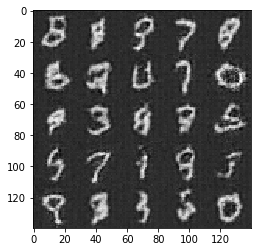

In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.5637... Generator Loss: 0.3857
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 0.8554... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.8084
Epoch 1/1... Discriminator Loss: 0.9981... Generator Loss: 0.6059


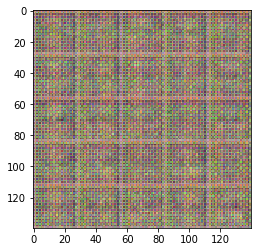

Epoch 1/1... Discriminator Loss: 0.5094... Generator Loss: 1.2703
Epoch 1/1... Discriminator Loss: 0.6756... Generator Loss: 1.0448
Epoch 1/1... Discriminator Loss: 0.5983... Generator Loss: 1.6325
Epoch 1/1... Discriminator Loss: 1.0630... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 0.5700... Generator Loss: 1.4681


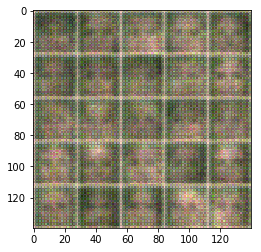

Epoch 1/1... Discriminator Loss: 0.3813... Generator Loss: 1.9089
Epoch 1/1... Discriminator Loss: 0.4641... Generator Loss: 1.3185
Epoch 1/1... Discriminator Loss: 0.2823... Generator Loss: 2.7652
Epoch 1/1... Discriminator Loss: 0.3368... Generator Loss: 1.7972
Epoch 1/1... Discriminator Loss: 0.3517... Generator Loss: 1.6837


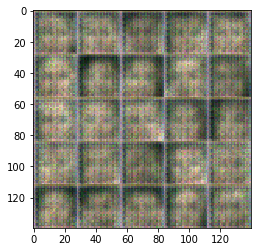

Epoch 1/1... Discriminator Loss: 0.4276... Generator Loss: 1.3345
Epoch 1/1... Discriminator Loss: 0.4077... Generator Loss: 1.7516
Epoch 1/1... Discriminator Loss: 0.2700... Generator Loss: 2.7360
Epoch 1/1... Discriminator Loss: 0.3467... Generator Loss: 1.7145
Epoch 1/1... Discriminator Loss: 0.4705... Generator Loss: 1.2970


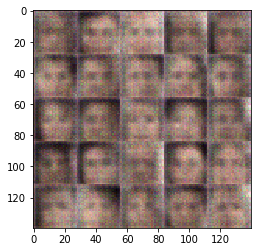

Epoch 1/1... Discriminator Loss: 0.3894... Generator Loss: 5.0596
Epoch 1/1... Discriminator Loss: 0.3492... Generator Loss: 1.9741
Epoch 1/1... Discriminator Loss: 0.4462... Generator Loss: 4.6487
Epoch 1/1... Discriminator Loss: 0.1502... Generator Loss: 4.8429
Epoch 1/1... Discriminator Loss: 0.2871... Generator Loss: 2.9534


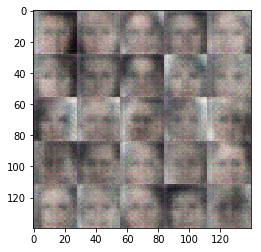

Epoch 1/1... Discriminator Loss: 0.8984... Generator Loss: 2.5612
Epoch 1/1... Discriminator Loss: 0.1462... Generator Loss: 4.7842
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 1.2470
Epoch 1/1... Discriminator Loss: 0.3679... Generator Loss: 2.8243
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.6191


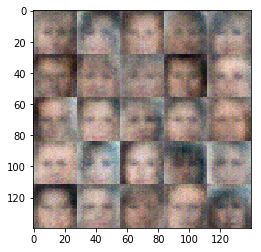

Epoch 1/1... Discriminator Loss: 0.2302... Generator Loss: 2.4369
Epoch 1/1... Discriminator Loss: 0.7908... Generator Loss: 0.8949
Epoch 1/1... Discriminator Loss: 1.2746... Generator Loss: 0.9584
Epoch 1/1... Discriminator Loss: 0.2172... Generator Loss: 3.2569
Epoch 1/1... Discriminator Loss: 0.8836... Generator Loss: 1.8828


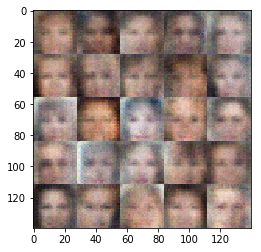

Epoch 1/1... Discriminator Loss: 0.5099... Generator Loss: 1.2625
Epoch 1/1... Discriminator Loss: 0.1391... Generator Loss: 3.7544
Epoch 1/1... Discriminator Loss: 0.1554... Generator Loss: 3.1522
Epoch 1/1... Discriminator Loss: 0.6287... Generator Loss: 5.0467
Epoch 1/1... Discriminator Loss: 0.7335... Generator Loss: 0.9313


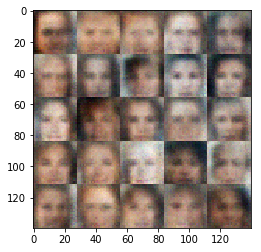

Epoch 1/1... Discriminator Loss: 0.5491... Generator Loss: 1.2344
Epoch 1/1... Discriminator Loss: 0.4142... Generator Loss: 1.4292
Epoch 1/1... Discriminator Loss: 0.2823... Generator Loss: 2.6531
Epoch 1/1... Discriminator Loss: 3.3773... Generator Loss: 0.0477
Epoch 1/1... Discriminator Loss: 0.2522... Generator Loss: 2.1342


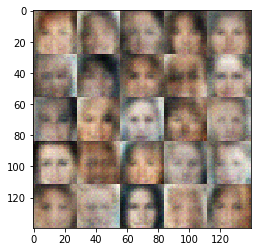

Epoch 1/1... Discriminator Loss: 0.4102... Generator Loss: 1.6367
Epoch 1/1... Discriminator Loss: 0.6477... Generator Loss: 0.9117
Epoch 1/1... Discriminator Loss: 0.4016... Generator Loss: 2.3260
Epoch 1/1... Discriminator Loss: 0.7094... Generator Loss: 3.1783
Epoch 1/1... Discriminator Loss: 2.3280... Generator Loss: 0.1483


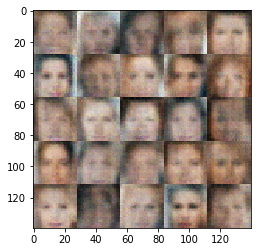

Epoch 1/1... Discriminator Loss: 0.1880... Generator Loss: 6.0165
Epoch 1/1... Discriminator Loss: 0.2445... Generator Loss: 3.4818
Epoch 1/1... Discriminator Loss: 0.3244... Generator Loss: 2.6496
Epoch 1/1... Discriminator Loss: 0.1364... Generator Loss: 4.0162
Epoch 1/1... Discriminator Loss: 0.0830... Generator Loss: 4.5236


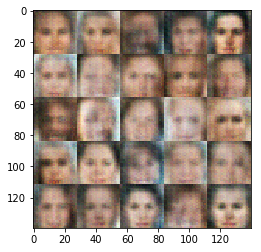

Epoch 1/1... Discriminator Loss: 0.8329... Generator Loss: 0.7143
Epoch 1/1... Discriminator Loss: 0.6352... Generator Loss: 1.6288
Epoch 1/1... Discriminator Loss: 0.0718... Generator Loss: 6.0585
Epoch 1/1... Discriminator Loss: 0.5381... Generator Loss: 1.3682
Epoch 1/1... Discriminator Loss: 0.2980... Generator Loss: 1.7162


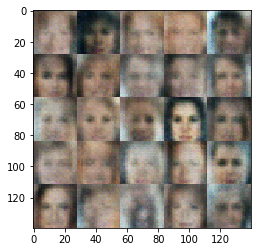

Epoch 1/1... Discriminator Loss: 0.5798... Generator Loss: 9.5643
Epoch 1/1... Discriminator Loss: 1.7098... Generator Loss: 0.2443
Epoch 1/1... Discriminator Loss: 0.6311... Generator Loss: 0.9485
Epoch 1/1... Discriminator Loss: 0.0742... Generator Loss: 3.7787
Epoch 1/1... Discriminator Loss: 0.6832... Generator Loss: 0.8731


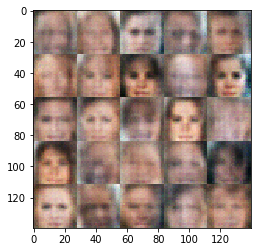

Epoch 1/1... Discriminator Loss: 0.2946... Generator Loss: 4.8612
Epoch 1/1... Discriminator Loss: 0.0988... Generator Loss: 3.9218
Epoch 1/1... Discriminator Loss: 0.7022... Generator Loss: 0.9621
Epoch 1/1... Discriminator Loss: 0.1875... Generator Loss: 2.4986
Epoch 1/1... Discriminator Loss: 0.6186... Generator Loss: 1.5118


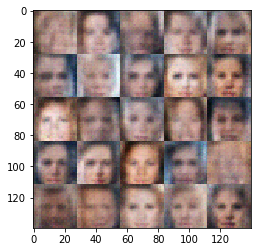

Epoch 1/1... Discriminator Loss: 0.2658... Generator Loss: 3.6080
Epoch 1/1... Discriminator Loss: 0.4879... Generator Loss: 6.6242
Epoch 1/1... Discriminator Loss: 0.4119... Generator Loss: 10.3161
Epoch 1/1... Discriminator Loss: 0.2715... Generator Loss: 4.7350
Epoch 1/1... Discriminator Loss: 0.3066... Generator Loss: 4.0591


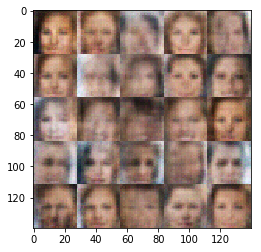

Epoch 1/1... Discriminator Loss: 0.0798... Generator Loss: 4.8165
Epoch 1/1... Discriminator Loss: 0.0613... Generator Loss: 3.7666
Epoch 1/1... Discriminator Loss: 0.5576... Generator Loss: 1.1220
Epoch 1/1... Discriminator Loss: 0.0605... Generator Loss: 4.4238
Epoch 1/1... Discriminator Loss: 0.2276... Generator Loss: 3.3877


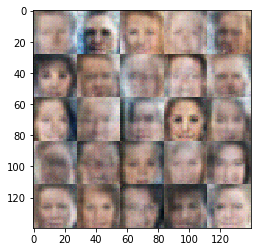

Epoch 1/1... Discriminator Loss: 0.0808... Generator Loss: 6.4121
Epoch 1/1... Discriminator Loss: 0.0657... Generator Loss: 4.1920
Epoch 1/1... Discriminator Loss: 0.5935... Generator Loss: 10.4655
Epoch 1/1... Discriminator Loss: 0.2524... Generator Loss: 4.9654
Epoch 1/1... Discriminator Loss: 1.0952... Generator Loss: 0.5943


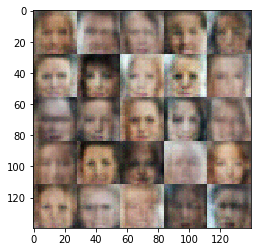

Epoch 1/1... Discriminator Loss: 0.1584... Generator Loss: 2.3018
Epoch 1/1... Discriminator Loss: 1.2605... Generator Loss: 0.4251
Epoch 1/1... Discriminator Loss: 0.2346... Generator Loss: 2.1232
Epoch 1/1... Discriminator Loss: 0.3913... Generator Loss: 6.1157
Epoch 1/1... Discriminator Loss: 0.1407... Generator Loss: 3.9208


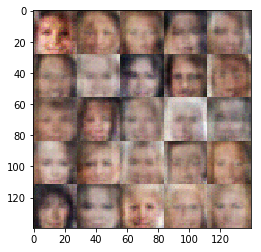

Epoch 1/1... Discriminator Loss: 0.0543... Generator Loss: 4.8937
Epoch 1/1... Discriminator Loss: 0.3739... Generator Loss: 1.5875
Epoch 1/1... Discriminator Loss: 1.6206... Generator Loss: 0.3066
Epoch 1/1... Discriminator Loss: 0.6845... Generator Loss: 3.0526
Epoch 1/1... Discriminator Loss: 0.1386... Generator Loss: 2.6027


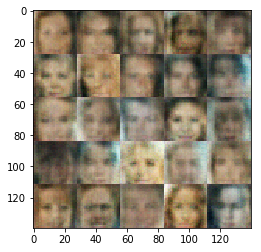

Epoch 1/1... Discriminator Loss: 0.1983... Generator Loss: 2.3479
Epoch 1/1... Discriminator Loss: 0.2069... Generator Loss: 2.8238
Epoch 1/1... Discriminator Loss: 0.9267... Generator Loss: 0.7244
Epoch 1/1... Discriminator Loss: 0.3119... Generator Loss: 2.2596
Epoch 1/1... Discriminator Loss: 0.6933... Generator Loss: 5.8567


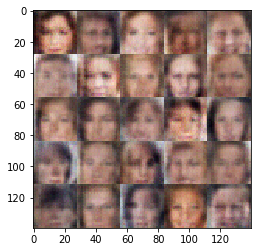

Epoch 1/1... Discriminator Loss: 0.3735... Generator Loss: 4.3917
Epoch 1/1... Discriminator Loss: 0.1879... Generator Loss: 2.3370
Epoch 1/1... Discriminator Loss: 0.0674... Generator Loss: 4.7006
Epoch 1/1... Discriminator Loss: 0.4358... Generator Loss: 4.0829
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.4993


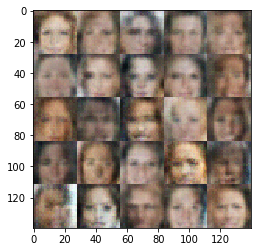

Epoch 1/1... Discriminator Loss: 0.1974... Generator Loss: 2.1479
Epoch 1/1... Discriminator Loss: 0.1819... Generator Loss: 2.2443
Epoch 1/1... Discriminator Loss: 0.0218... Generator Loss: 9.3011
Epoch 1/1... Discriminator Loss: 0.3626... Generator Loss: 5.5777
Epoch 1/1... Discriminator Loss: 0.0395... Generator Loss: 4.9238


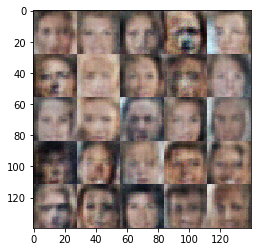

Epoch 1/1... Discriminator Loss: 1.7087... Generator Loss: 0.2772
Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 0.5694... Generator Loss: 1.8860
Epoch 1/1... Discriminator Loss: 0.1672... Generator Loss: 8.2316
Epoch 1/1... Discriminator Loss: 0.5816... Generator Loss: 1.0639


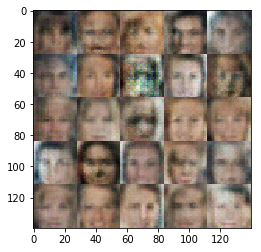

Epoch 1/1... Discriminator Loss: 0.1768... Generator Loss: 3.9988
Epoch 1/1... Discriminator Loss: 0.6814... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 0.2552... Generator Loss: 2.0153
Epoch 1/1... Discriminator Loss: 0.5601... Generator Loss: 1.0356
Epoch 1/1... Discriminator Loss: 0.0268... Generator Loss: 5.8680


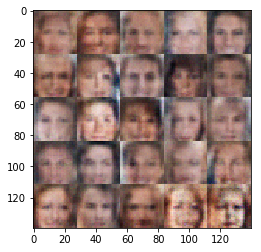

Epoch 1/1... Discriminator Loss: 0.3207... Generator Loss: 11.9808
Epoch 1/1... Discriminator Loss: 0.0771... Generator Loss: 5.0234
Epoch 1/1... Discriminator Loss: 0.0601... Generator Loss: 4.1798
Epoch 1/1... Discriminator Loss: 0.0351... Generator Loss: 12.5509
Epoch 1/1... Discriminator Loss: 0.0334... Generator Loss: 5.1692


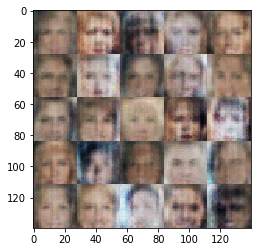

Epoch 1/1... Discriminator Loss: 0.0182... Generator Loss: 5.1976
Epoch 1/1... Discriminator Loss: 0.0602... Generator Loss: 3.9009
Epoch 1/1... Discriminator Loss: 0.0168... Generator Loss: 5.5922
Epoch 1/1... Discriminator Loss: 0.1208... Generator Loss: 8.2284
Epoch 1/1... Discriminator Loss: 0.0381... Generator Loss: 3.6371


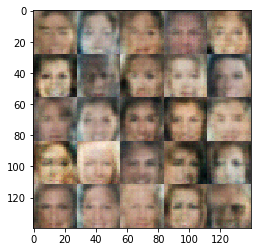

Epoch 1/1... Discriminator Loss: 0.0275... Generator Loss: 7.6096
Epoch 1/1... Discriminator Loss: 0.0594... Generator Loss: 9.2480
Epoch 1/1... Discriminator Loss: 0.0144... Generator Loss: 5.3356
Epoch 1/1... Discriminator Loss: 0.8069... Generator Loss: 1.0851
Epoch 1/1... Discriminator Loss: 0.0328... Generator Loss: 5.1382


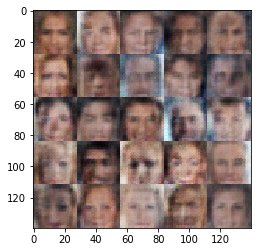

Epoch 1/1... Discriminator Loss: 0.4203... Generator Loss: 5.2148
Epoch 1/1... Discriminator Loss: 0.0573... Generator Loss: 7.8235
Epoch 1/1... Discriminator Loss: 0.8650... Generator Loss: 0.7032
Epoch 1/1... Discriminator Loss: 0.3087... Generator Loss: 1.6554
Epoch 1/1... Discriminator Loss: 0.9171... Generator Loss: 0.7480


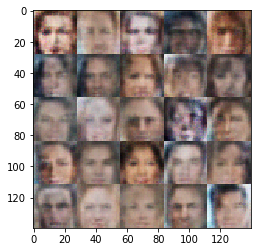

Epoch 1/1... Discriminator Loss: 0.0159... Generator Loss: 12.1092
Epoch 1/1... Discriminator Loss: 0.0285... Generator Loss: 11.5025
Epoch 1/1... Discriminator Loss: 0.2435... Generator Loss: 6.7255
Epoch 1/1... Discriminator Loss: 0.0332... Generator Loss: 10.9058
Epoch 1/1... Discriminator Loss: 0.1190... Generator Loss: 2.7781


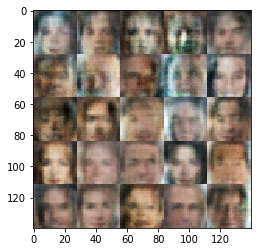

Epoch 1/1... Discriminator Loss: 0.0219... Generator Loss: 13.5004
Epoch 1/1... Discriminator Loss: 0.0204... Generator Loss: 5.5511
Epoch 1/1... Discriminator Loss: 0.5338... Generator Loss: 1.2081
Epoch 1/1... Discriminator Loss: 0.0438... Generator Loss: 4.3037
Epoch 1/1... Discriminator Loss: 0.0223... Generator Loss: 5.9844


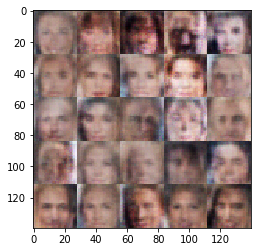

Epoch 1/1... Discriminator Loss: 0.0954... Generator Loss: 7.1306
Epoch 1/1... Discriminator Loss: 1.1030... Generator Loss: 0.5396
Epoch 1/1... Discriminator Loss: 0.0162... Generator Loss: 13.8843
Epoch 1/1... Discriminator Loss: 0.5762... Generator Loss: 0.9926
Epoch 1/1... Discriminator Loss: 0.0454... Generator Loss: 12.0518


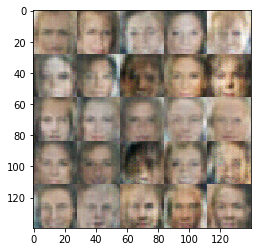

Epoch 1/1... Discriminator Loss: 0.0038... Generator Loss: 10.5471
Epoch 1/1... Discriminator Loss: 0.0125... Generator Loss: 6.8616
Epoch 1/1... Discriminator Loss: 0.0103... Generator Loss: 5.2868
Epoch 1/1... Discriminator Loss: 0.0088... Generator Loss: 13.1443
Epoch 1/1... Discriminator Loss: 0.0245... Generator Loss: 7.6267


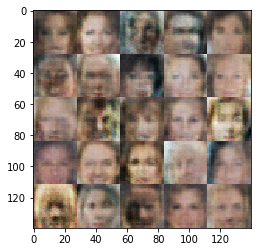

Epoch 1/1... Discriminator Loss: 0.1970... Generator Loss: 3.3937
Epoch 1/1... Discriminator Loss: 0.1629... Generator Loss: 2.4654
Epoch 1/1... Discriminator Loss: 0.0477... Generator Loss: 9.4635
Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 0.8958
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 7.6415


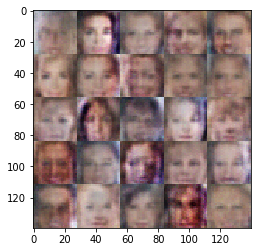

Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 7.5084
Epoch 1/1... Discriminator Loss: 0.0113... Generator Loss: 6.3919
Epoch 1/1... Discriminator Loss: 0.0177... Generator Loss: 15.4687
Epoch 1/1... Discriminator Loss: 0.0245... Generator Loss: 6.9890
Epoch 1/1... Discriminator Loss: 0.0074... Generator Loss: 13.6835


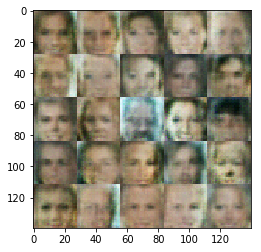

Epoch 1/1... Discriminator Loss: 0.0446... Generator Loss: 4.0446
Epoch 1/1... Discriminator Loss: 0.0321... Generator Loss: 14.8322
Epoch 1/1... Discriminator Loss: 0.0603... Generator Loss: 7.1864
Epoch 1/1... Discriminator Loss: 0.0093... Generator Loss: 12.0883
Epoch 1/1... Discriminator Loss: 0.0100... Generator Loss: 14.1704


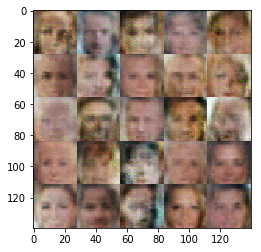

Epoch 1/1... Discriminator Loss: 0.0107... Generator Loss: 9.1208
Epoch 1/1... Discriminator Loss: 0.1459... Generator Loss: 2.5808
Epoch 1/1... Discriminator Loss: 0.0244... Generator Loss: 5.4676
Epoch 1/1... Discriminator Loss: 0.0487... Generator Loss: 3.8387
Epoch 1/1... Discriminator Loss: 0.0236... Generator Loss: 15.4573


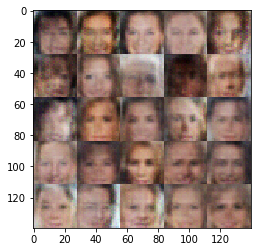

Epoch 1/1... Discriminator Loss: 0.0075... Generator Loss: 15.3355
Epoch 1/1... Discriminator Loss: 0.0188... Generator Loss: 7.8785
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 15.3071
Epoch 1/1... Discriminator Loss: 0.0207... Generator Loss: 4.4747
Epoch 1/1... Discriminator Loss: 0.1031... Generator Loss: 10.8739


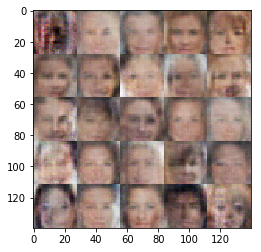

Epoch 1/1... Discriminator Loss: 0.0504... Generator Loss: 4.3749
Epoch 1/1... Discriminator Loss: 0.0105... Generator Loss: 8.7025
Epoch 1/1... Discriminator Loss: 0.0035... Generator Loss: 13.3428
Epoch 1/1... Discriminator Loss: 0.5828... Generator Loss: 1.1998
Epoch 1/1... Discriminator Loss: 0.0049... Generator Loss: 13.6317


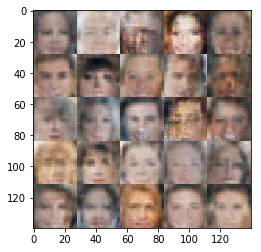

Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 15.9187
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 8.5560
Epoch 1/1... Discriminator Loss: 0.0221... Generator Loss: 11.3149
Epoch 1/1... Discriminator Loss: 0.0512... Generator Loss: 3.7749
Epoch 1/1... Discriminator Loss: 0.0380... Generator Loss: 7.6469


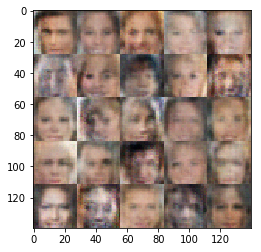

Epoch 1/1... Discriminator Loss: 0.0818... Generator Loss: 4.7387
Epoch 1/1... Discriminator Loss: 0.0066... Generator Loss: 8.9684
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 7.7882
Epoch 1/1... Discriminator Loss: 0.0039... Generator Loss: 7.9679
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 5.8165


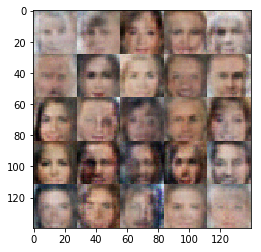

Epoch 1/1... Discriminator Loss: 0.0175... Generator Loss: 10.4846
Epoch 1/1... Discriminator Loss: 0.1917... Generator Loss: 2.0989
Epoch 1/1... Discriminator Loss: 0.0067... Generator Loss: 12.0082
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 12.0645
Epoch 1/1... Discriminator Loss: 0.5108... Generator Loss: 1.1278


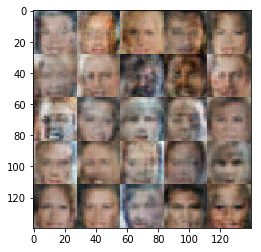

Epoch 1/1... Discriminator Loss: 0.0046... Generator Loss: 11.1432
Epoch 1/1... Discriminator Loss: 0.0058... Generator Loss: 10.8116
Epoch 1/1... Discriminator Loss: 0.0111... Generator Loss: 9.4611
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 8.2426
Epoch 1/1... Discriminator Loss: 0.0091... Generator Loss: 14.3892


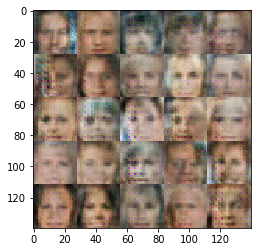

Epoch 1/1... Discriminator Loss: 0.0092... Generator Loss: 6.3437
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 11.9613
Epoch 1/1... Discriminator Loss: 0.0124... Generator Loss: 5.1904
Epoch 1/1... Discriminator Loss: 0.0151... Generator Loss: 15.9077
Epoch 1/1... Discriminator Loss: 0.0076... Generator Loss: 8.8439


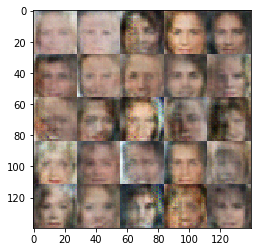

Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 8.6395
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 11.4709
Epoch 1/1... Discriminator Loss: 0.4093... Generator Loss: 1.5359
Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 10.9307
Epoch 1/1... Discriminator Loss: 0.0072... Generator Loss: 5.8637


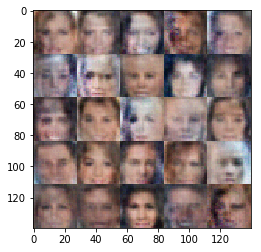

Epoch 1/1... Discriminator Loss: 0.0177... Generator Loss: 5.8792
Epoch 1/1... Discriminator Loss: 0.0387... Generator Loss: 10.0932
Epoch 1/1... Discriminator Loss: 0.1232... Generator Loss: 10.5857
Epoch 1/1... Discriminator Loss: 0.0113... Generator Loss: 16.0158
Epoch 1/1... Discriminator Loss: 0.1861... Generator Loss: 9.3807


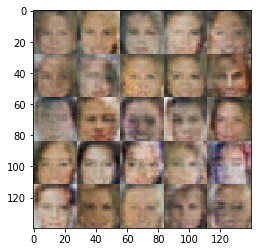

Epoch 1/1... Discriminator Loss: 0.4489... Generator Loss: 1.4999
Epoch 1/1... Discriminator Loss: 0.0046... Generator Loss: 13.7545
Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 17.1481
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 11.8286
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 16.2575


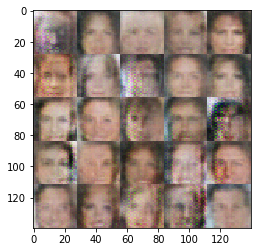

Epoch 1/1... Discriminator Loss: 0.0052... Generator Loss: 8.6757
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 8.6100
Epoch 1/1... Discriminator Loss: 0.0046... Generator Loss: 7.2785
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 11.2407
Epoch 1/1... Discriminator Loss: 0.0050... Generator Loss: 6.7718


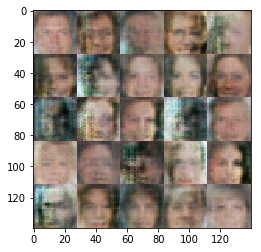

Epoch 1/1... Discriminator Loss: 0.0131... Generator Loss: 6.0017
Epoch 1/1... Discriminator Loss: 0.0506... Generator Loss: 3.4882
Epoch 1/1... Discriminator Loss: 0.0045... Generator Loss: 7.3833
Epoch 1/1... Discriminator Loss: 0.0067... Generator Loss: 6.0073
Epoch 1/1... Discriminator Loss: 0.0991... Generator Loss: 2.8341


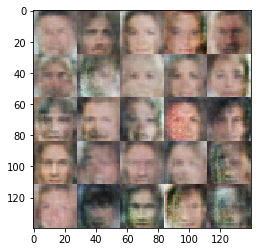

Epoch 1/1... Discriminator Loss: 0.0401... Generator Loss: 12.8951
Epoch 1/1... Discriminator Loss: 0.0135... Generator Loss: 6.6231
Epoch 1/1... Discriminator Loss: 0.1060... Generator Loss: 3.2282
Epoch 1/1... Discriminator Loss: 0.0208... Generator Loss: 8.0634
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.2664


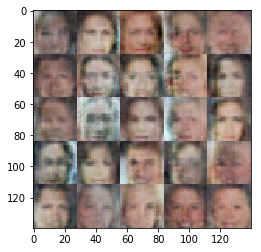

Epoch 1/1... Discriminator Loss: 0.0146... Generator Loss: 5.0151
Epoch 1/1... Discriminator Loss: 0.0294... Generator Loss: 8.1153
Epoch 1/1... Discriminator Loss: 0.0114... Generator Loss: 12.1868
Epoch 1/1... Discriminator Loss: 0.0613... Generator Loss: 3.2446
Epoch 1/1... Discriminator Loss: 0.0047... Generator Loss: 7.9526


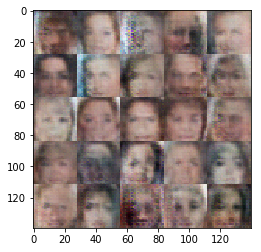

Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 6.6886
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 11.8296
Epoch 1/1... Discriminator Loss: 0.0118... Generator Loss: 11.3873
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 7.4640
Epoch 1/1... Discriminator Loss: 0.0340... Generator Loss: 9.3599


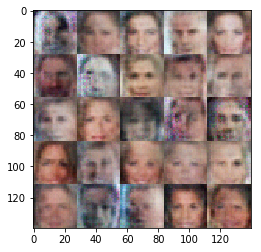

Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 7.7554
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.3944
Epoch 1/1... Discriminator Loss: 0.1365... Generator Loss: 11.4238
Epoch 1/1... Discriminator Loss: 0.0062... Generator Loss: 10.1267
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 8.4307


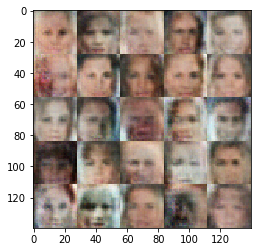

Epoch 1/1... Discriminator Loss: 0.1524... Generator Loss: 2.5435
Epoch 1/1... Discriminator Loss: 0.0038... Generator Loss: 7.1828
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 8.9331
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 16.7903
Epoch 1/1... Discriminator Loss: 0.0590... Generator Loss: 3.3517


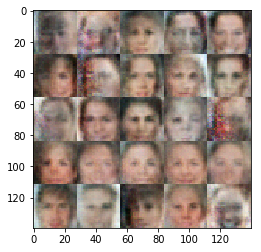

Epoch 1/1... Discriminator Loss: 0.0193... Generator Loss: 8.6468
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 7.9889
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 6.0724
Epoch 1/1... Discriminator Loss: 0.0343... Generator Loss: 11.2677
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 9.2707


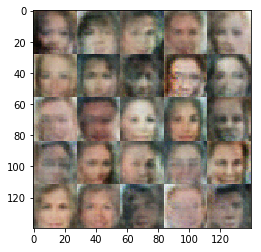

Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 10.8781
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 10.5438
Epoch 1/1... Discriminator Loss: 0.0168... Generator Loss: 5.0397
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.8383
Epoch 1/1... Discriminator Loss: 0.0592... Generator Loss: 4.5007


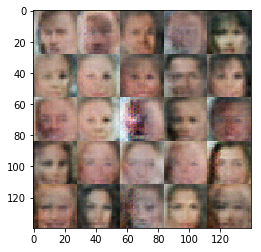

Epoch 1/1... Discriminator Loss: 0.0154... Generator Loss: 6.1686
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 8.0418
Epoch 1/1... Discriminator Loss: 0.0044... Generator Loss: 5.9709
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 9.5655
Epoch 1/1... Discriminator Loss: 0.0129... Generator Loss: 14.1621


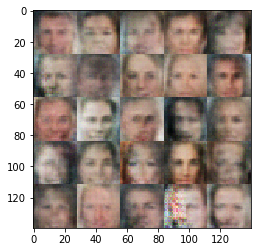

Epoch 1/1... Discriminator Loss: 0.0040... Generator Loss: 12.0508
Epoch 1/1... Discriminator Loss: 0.0145... Generator Loss: 11.1453
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 12.0416
Epoch 1/1... Discriminator Loss: 0.0055... Generator Loss: 14.2667
Epoch 1/1... Discriminator Loss: 0.0062... Generator Loss: 10.0506


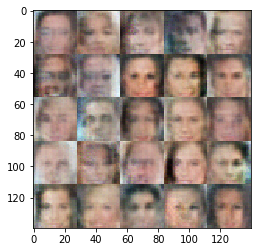

Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 13.5539
Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 12.1262
Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 7.4059
Epoch 1/1... Discriminator Loss: 1.8744... Generator Loss: 0.2130
Epoch 1/1... Discriminator Loss: 0.0248... Generator Loss: 7.0874


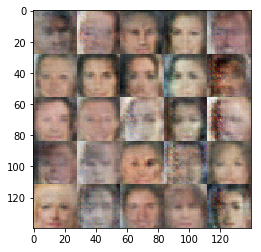

Epoch 1/1... Discriminator Loss: 1.4284... Generator Loss: 0.4221
Epoch 1/1... Discriminator Loss: 0.0209... Generator Loss: 7.2813
Epoch 1/1... Discriminator Loss: 0.0176... Generator Loss: 10.1187
Epoch 1/1... Discriminator Loss: 0.0163... Generator Loss: 12.5987
Epoch 1/1... Discriminator Loss: 0.0462... Generator Loss: 8.9761


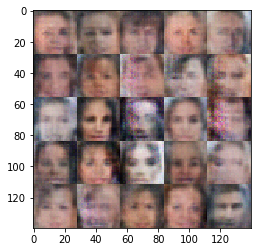

Epoch 1/1... Discriminator Loss: 0.0218... Generator Loss: 12.8639
Epoch 1/1... Discriminator Loss: 0.0315... Generator Loss: 4.2830
Epoch 1/1... Discriminator Loss: 0.0078... Generator Loss: 9.0915
Epoch 1/1... Discriminator Loss: 0.0499... Generator Loss: 3.7805
Epoch 1/1... Discriminator Loss: 0.0249... Generator Loss: 14.7042


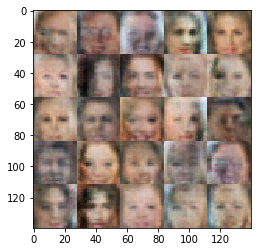

Epoch 1/1... Discriminator Loss: 0.0078... Generator Loss: 11.3643
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 11.5367
Epoch 1/1... Discriminator Loss: 0.0112... Generator Loss: 10.6529
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 8.8841
Epoch 1/1... Discriminator Loss: 0.0091... Generator Loss: 7.7559


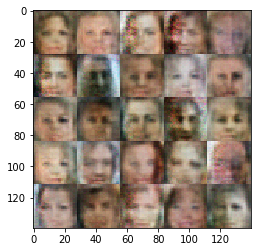

Epoch 1/1... Discriminator Loss: 0.0145... Generator Loss: 5.8547
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 13.4756
Epoch 1/1... Discriminator Loss: 0.0172... Generator Loss: 11.6698
Epoch 1/1... Discriminator Loss: 0.0095... Generator Loss: 5.6234
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 9.7355


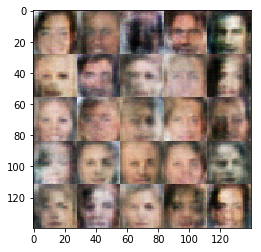

Epoch 1/1... Discriminator Loss: 0.0133... Generator Loss: 13.5164
Epoch 1/1... Discriminator Loss: 0.0331... Generator Loss: 8.4104
Epoch 1/1... Discriminator Loss: 0.0301... Generator Loss: 4.1055
Epoch 1/1... Discriminator Loss: 0.0073... Generator Loss: 6.1658
Epoch 1/1... Discriminator Loss: 0.0111... Generator Loss: 14.1569


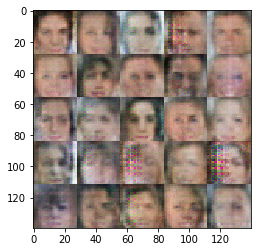

Epoch 1/1... Discriminator Loss: 0.0330... Generator Loss: 4.3869
Epoch 1/1... Discriminator Loss: 0.0087... Generator Loss: 11.4303
Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 11.4963
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 7.4766
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 11.8495


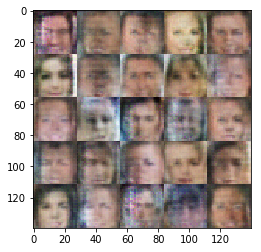

Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 11.4146
Epoch 1/1... Discriminator Loss: 0.0080... Generator Loss: 11.1398
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 12.5279
Epoch 1/1... Discriminator Loss: 0.0349... Generator Loss: 3.9116
Epoch 1/1... Discriminator Loss: 0.0067... Generator Loss: 14.9682


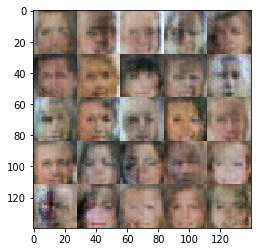

Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 13.2011
Epoch 1/1... Discriminator Loss: 0.0235... Generator Loss: 4.3113
Epoch 1/1... Discriminator Loss: 0.0147... Generator Loss: 12.5507
Epoch 1/1... Discriminator Loss: 0.0199... Generator Loss: 5.0531
Epoch 1/1... Discriminator Loss: 0.0464... Generator Loss: 14.0078


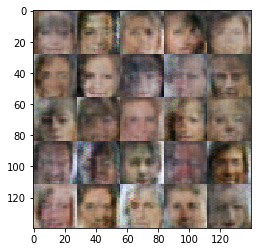

Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 11.0470
Epoch 1/1... Discriminator Loss: 0.0077... Generator Loss: 5.7437
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 14.5107
Epoch 1/1... Discriminator Loss: 0.0034... Generator Loss: 6.5847
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 6.7437


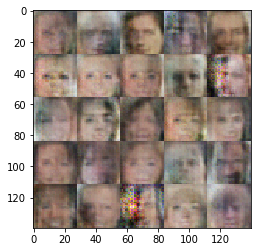

Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 7.7060
Epoch 1/1... Discriminator Loss: 0.0169... Generator Loss: 4.4026
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 9.4119
Epoch 1/1... Discriminator Loss: 0.0044... Generator Loss: 6.5992
Epoch 1/1... Discriminator Loss: 0.2529... Generator Loss: 11.8616


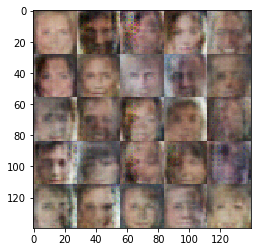

Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 14.7884
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 13.4813
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.5107
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 9.4366
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.6067


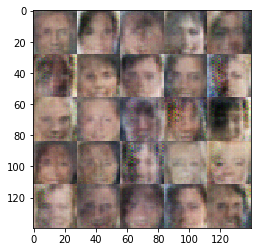

Epoch 1/1... Discriminator Loss: 0.1322... Generator Loss: 2.7257
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 13.5409
Epoch 1/1... Discriminator Loss: 0.0085... Generator Loss: 6.6712
Epoch 1/1... Discriminator Loss: 0.0037... Generator Loss: 12.5496
Epoch 1/1... Discriminator Loss: 0.0237... Generator Loss: 8.9652


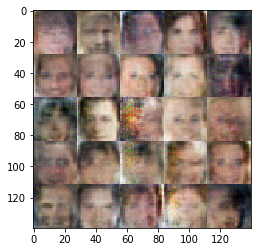

Epoch 1/1... Discriminator Loss: 0.1617... Generator Loss: 2.2392
Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 8.8097
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 8.9413
Epoch 1/1... Discriminator Loss: 0.0127... Generator Loss: 8.1188
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 14.8895


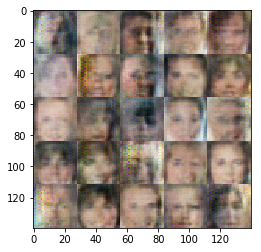

Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.3499
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 17.6219
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 11.1348
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 15.0134
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 14.2093


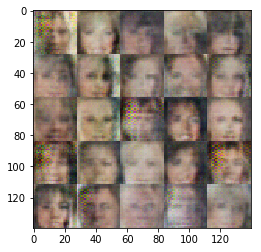

Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 7.4557
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 13.5553
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 10.2081
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 7.2877
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 11.5470


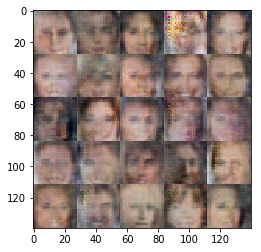

Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 10.7951
Epoch 1/1... Discriminator Loss: 0.0648... Generator Loss: 3.1171
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 13.0586
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 13.1300
Epoch 1/1... Discriminator Loss: 0.0183... Generator Loss: 4.8023


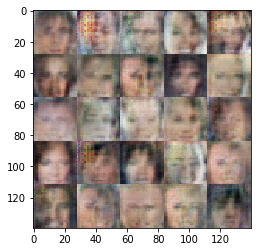

Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 11.7468
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 9.0746
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 11.2887
Epoch 1/1... Discriminator Loss: 0.0131... Generator Loss: 5.2671
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 10.3017


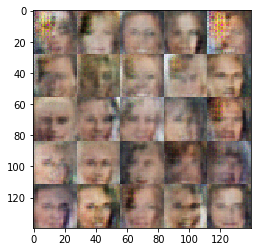

Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 14.0955
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 8.4002
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 8.5481
Epoch 1/1... Discriminator Loss: 0.2401... Generator Loss: 1.8316
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 13.9828


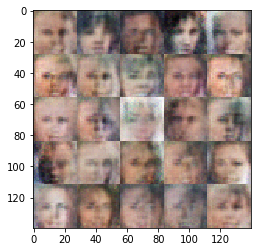

Epoch 1/1... Discriminator Loss: 0.0136... Generator Loss: 5.1301
Epoch 1/1... Discriminator Loss: 0.0110... Generator Loss: 13.6437
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 9.2158
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 15.0417
Epoch 1/1... Discriminator Loss: 0.0070... Generator Loss: 6.7743


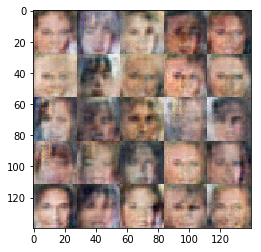

Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 9.7806
Epoch 1/1... Discriminator Loss: 0.0050... Generator Loss: 6.4611
Epoch 1/1... Discriminator Loss: 0.0116... Generator Loss: 10.5967
Epoch 1/1... Discriminator Loss: 0.6424... Generator Loss: 1.0366
Epoch 1/1... Discriminator Loss: 0.0181... Generator Loss: 9.1729


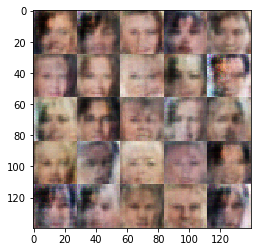

Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 8.7828
Epoch 1/1... Discriminator Loss: 0.0067... Generator Loss: 10.4858
Epoch 1/1... Discriminator Loss: 0.0115... Generator Loss: 6.7920
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 13.9714
Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 10.1235


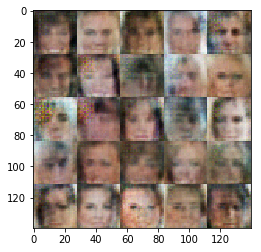

Epoch 1/1... Discriminator Loss: 0.0047... Generator Loss: 10.6958
Epoch 1/1... Discriminator Loss: 0.0356... Generator Loss: 3.7014
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 10.1867
Epoch 1/1... Discriminator Loss: 0.5453... Generator Loss: 1.0207
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 10.5421


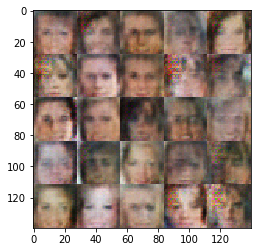

Epoch 1/1... Discriminator Loss: 0.0084... Generator Loss: 6.7175
Epoch 1/1... Discriminator Loss: 0.0028... Generator Loss: 7.7456
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.8973
Epoch 1/1... Discriminator Loss: 0.0056... Generator Loss: 6.0045
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 12.1915


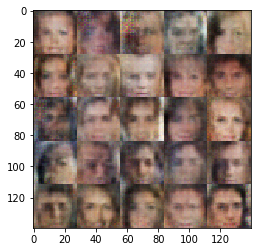

Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 8.2595
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 10.4200
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 10.2827
Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 10.1722
Epoch 1/1... Discriminator Loss: 0.0075... Generator Loss: 14.6217


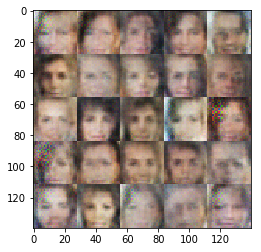

Epoch 1/1... Discriminator Loss: 0.0035... Generator Loss: 6.9413
Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 13.4405
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 7.1935
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 12.2153
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.9285


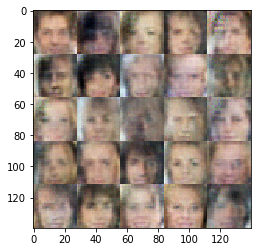

Epoch 1/1... Discriminator Loss: 0.0080... Generator Loss: 8.4718
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 11.9011
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 12.0864
Epoch 1/1... Discriminator Loss: 0.0116... Generator Loss: 8.7025
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 15.1321


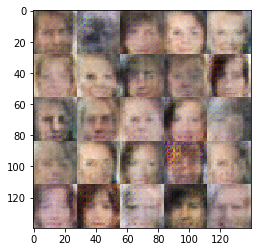

Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 8.4424
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 10.7809
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 11.5012
Epoch 1/1... Discriminator Loss: 0.0050... Generator Loss: 6.1763
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 7.7309


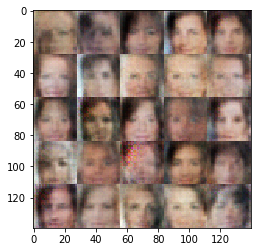

Epoch 1/1... Discriminator Loss: 0.0083... Generator Loss: 6.4440
Epoch 1/1... Discriminator Loss: 0.0105... Generator Loss: 13.9835
Epoch 1/1... Discriminator Loss: 0.0063... Generator Loss: 8.8193
Epoch 1/1... Discriminator Loss: 0.0049... Generator Loss: 16.4698
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 12.4514


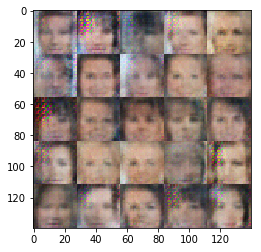

Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.0350
Epoch 1/1... Discriminator Loss: 0.0016... Generator Loss: 7.7432
Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 7.3133
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 12.5891
Epoch 1/1... Discriminator Loss: 0.0120... Generator Loss: 13.4098


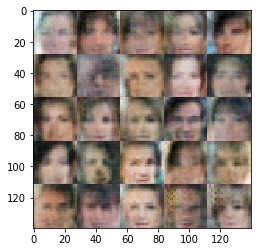

Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 11.0766
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 11.7361
Epoch 1/1... Discriminator Loss: 0.0378... Generator Loss: 3.8166
Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 12.5408
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 11.5298


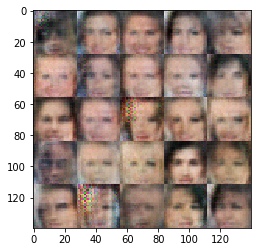

Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 8.6022
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 10.9329
Epoch 1/1... Discriminator Loss: 0.1126... Generator Loss: 2.5865
Epoch 1/1... Discriminator Loss: 0.2169... Generator Loss: 1.8554
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 11.7669


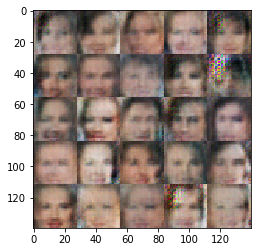

Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 13.2333
Epoch 1/1... Discriminator Loss: 0.0088... Generator Loss: 14.9466
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 10.8131
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 14.6676
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 9.8724


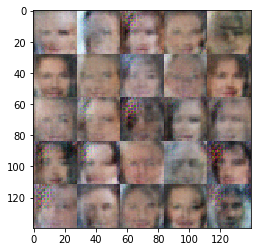

Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 11.6806
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 15.5638
Epoch 1/1... Discriminator Loss: 0.0041... Generator Loss: 6.1165
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.0893
Epoch 1/1... Discriminator Loss: 0.0157... Generator Loss: 4.8318


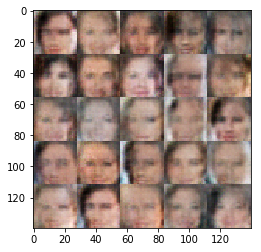

Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 9.9507
Epoch 1/1... Discriminator Loss: 0.0061... Generator Loss: 6.1994
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 16.8157
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 7.2205
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 7.5063


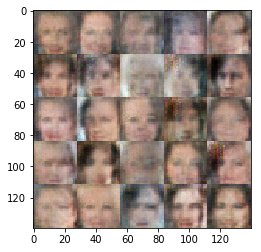

Epoch 1/1... Discriminator Loss: 0.0040... Generator Loss: 14.9453
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.5694
Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 11.0194
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 10.2660
Epoch 1/1... Discriminator Loss: 0.0091... Generator Loss: 14.6970


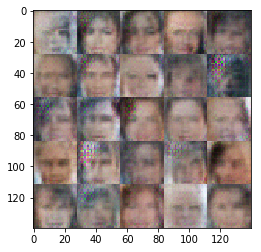

Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.7666
Epoch 1/1... Discriminator Loss: 0.0170... Generator Loss: 4.5505
Epoch 1/1... Discriminator Loss: 0.0051... Generator Loss: 8.7883
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 13.1897
Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 9.7279


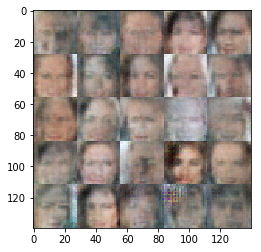

Epoch 1/1... Discriminator Loss: 0.0058... Generator Loss: 6.4462
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 6.9963
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 7.4831
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 13.8628
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 11.9892


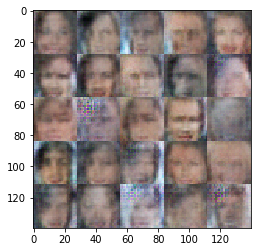

Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 14.1493
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 8.4901
Epoch 1/1... Discriminator Loss: 0.0174... Generator Loss: 4.6649
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 8.7784
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 11.5947


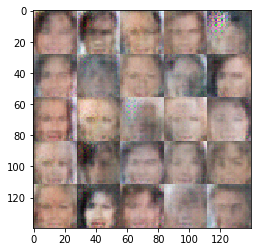

Epoch 1/1... Discriminator Loss: 0.0171... Generator Loss: 4.8412
Epoch 1/1... Discriminator Loss: 0.0637... Generator Loss: 3.0063
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 13.6371
Epoch 1/1... Discriminator Loss: 0.0043... Generator Loss: 9.2153
Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 13.1524


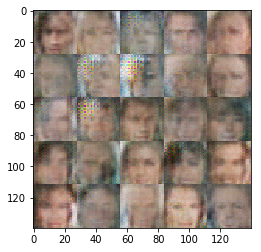

Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 6.4992
Epoch 1/1... Discriminator Loss: 0.0017... Generator Loss: 9.2582
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 12.1068
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 9.6075
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.8152


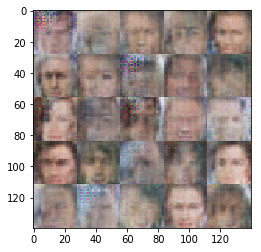

Epoch 1/1... Discriminator Loss: 0.0032... Generator Loss: 8.7414
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.1201
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 13.4561
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 15.4550
Epoch 1/1... Discriminator Loss: 0.0084... Generator Loss: 6.1012


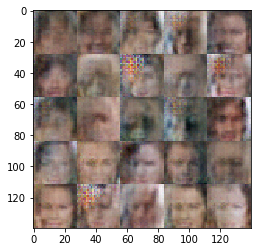

Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 9.0034
Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 11.1826
Epoch 1/1... Discriminator Loss: 0.0752... Generator Loss: 3.1578
Epoch 1/1... Discriminator Loss: 0.0063... Generator Loss: 6.4094
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.5539


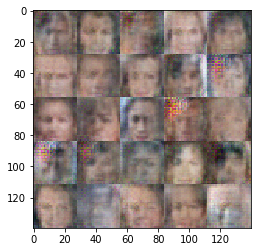

Epoch 1/1... Discriminator Loss: 0.0026... Generator Loss: 9.8288
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 13.0494
Epoch 1/1... Discriminator Loss: 0.0014... Generator Loss: 8.3727
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 10.1874
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 14.5134


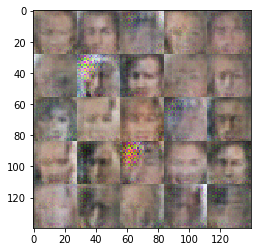

Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 13.7477
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 8.6820
Epoch 1/1... Discriminator Loss: 0.0089... Generator Loss: 5.8671
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 9.8795
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 9.9823


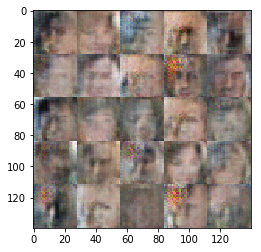

Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 6.5603
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 15.9613
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 14.4812
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 7.7319
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 6.3864


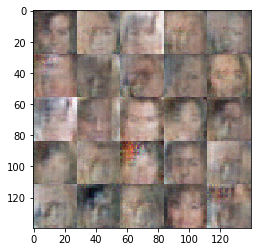

Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 6.6427
Epoch 1/1... Discriminator Loss: 0.0093... Generator Loss: 5.5012
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 6.9461
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 8.2172
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 8.2699


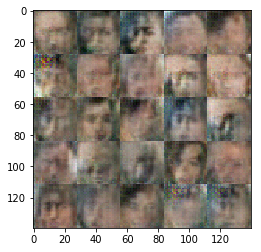

Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 12.2647
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 8.6336
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.7340
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 9.7618
Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 6.9244


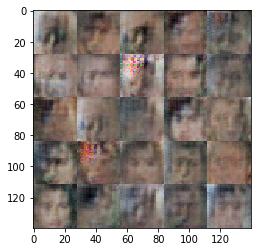

Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 11.0171
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 13.8731
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.0238
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 17.4960
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.7612


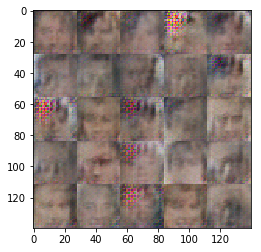

Epoch 1/1... Discriminator Loss: 0.0022... Generator Loss: 9.7369
Epoch 1/1... Discriminator Loss: 0.0300... Generator Loss: 4.0091
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 13.8212
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 8.8662
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 12.2725


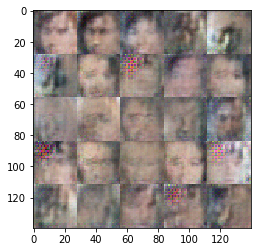

Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 11.1563
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.7471
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 9.1315
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.5488
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 14.3454


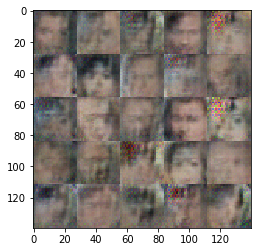

Epoch 1/1... Discriminator Loss: 0.0044... Generator Loss: 5.9542
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 8.3038
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 8.3727
Epoch 1/1... Discriminator Loss: 0.0099... Generator Loss: 5.0883
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 14.8870


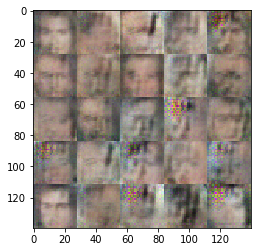

Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 12.2323
Epoch 1/1... Discriminator Loss: 0.0217... Generator Loss: 4.7033
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 7.9569
Epoch 1/1... Discriminator Loss: 0.0035... Generator Loss: 6.8555
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 11.2779


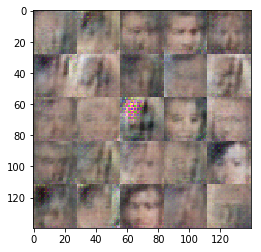

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.8000
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.5452
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 16.7061
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.3705
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 8.9954


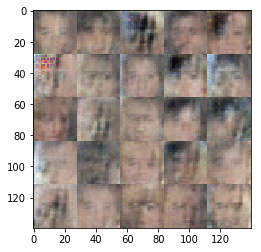

Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 7.4058
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 18.7104
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 9.8399
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 13.0955
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 7.7410


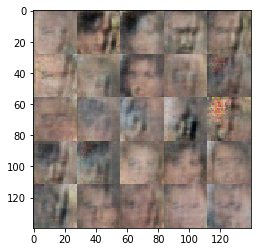

Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 11.1523
Epoch 1/1... Discriminator Loss: 0.0036... Generator Loss: 8.9594
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.7553
Epoch 1/1... Discriminator Loss: 0.0058... Generator Loss: 6.3609
Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 12.1905


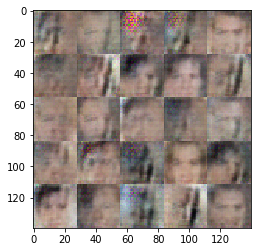

Epoch 1/1... Discriminator Loss: 0.0024... Generator Loss: 7.0666
Epoch 1/1... Discriminator Loss: 0.0009... Generator Loss: 8.2687
Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 5.5270
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 10.1089
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 6.9726


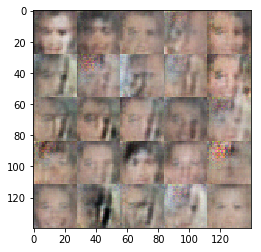

Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 11.3631
Epoch 1/1... Discriminator Loss: 0.0033... Generator Loss: 7.1474
Epoch 1/1... Discriminator Loss: 0.0042... Generator Loss: 8.1745
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 6.7279
Epoch 1/1... Discriminator Loss: 0.0011... Generator Loss: 11.3770


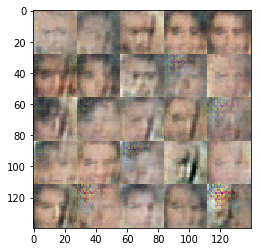

Epoch 1/1... Discriminator Loss: 0.0023... Generator Loss: 9.1975
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 16.7024
Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 14.8810
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 13.2465
Epoch 1/1... Discriminator Loss: 0.0040... Generator Loss: 6.3391


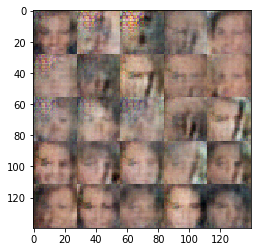

Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 13.7913
Epoch 1/1... Discriminator Loss: 0.0111... Generator Loss: 5.2159
Epoch 1/1... Discriminator Loss: 0.0005... Generator Loss: 10.7883
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 13.1919
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 8.3437


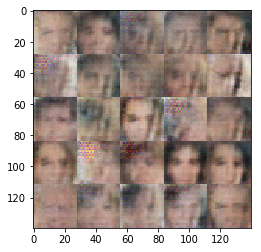

Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 7.8970
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 15.3912
Epoch 1/1... Discriminator Loss: 0.0029... Generator Loss: 11.0223
Epoch 1/1... Discriminator Loss: 0.0002... Generator Loss: 14.0873
Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 11.0090


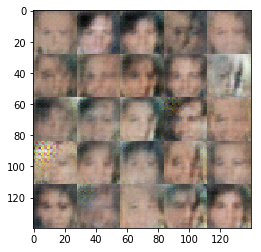

Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 12.3411
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 11.6870
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 15.6368
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 12.5876
Epoch 1/1... Discriminator Loss: 0.0007... Generator Loss: 13.3093


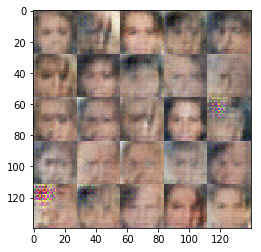

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 17.9079
Epoch 1/1... Discriminator Loss: 0.0119... Generator Loss: 5.0061
Epoch 1/1... Discriminator Loss: 0.0020... Generator Loss: 14.1545
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 10.8580
Epoch 1/1... Discriminator Loss: 0.0015... Generator Loss: 9.7760


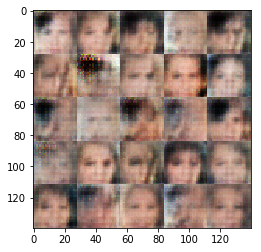

Epoch 1/1... Discriminator Loss: 0.0001... Generator Loss: 10.1175
Epoch 1/1... Discriminator Loss: 0.0031... Generator Loss: 8.7404
Epoch 1/1... Discriminator Loss: 0.0018... Generator Loss: 7.2243
Epoch 1/1... Discriminator Loss: 0.0050... Generator Loss: 12.9595
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 10.1927


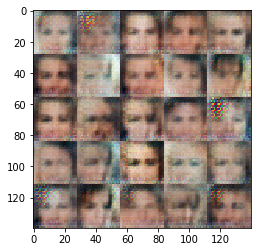

Epoch 1/1... Discriminator Loss: 0.0205... Generator Loss: 4.8462
Epoch 1/1... Discriminator Loss: 0.0053... Generator Loss: 5.7729
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 11.4746
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 9.0006
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.2379


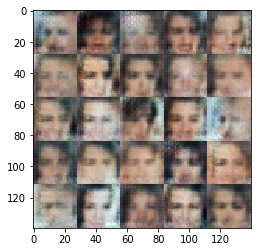

Epoch 1/1... Discriminator Loss: 0.0013... Generator Loss: 12.5392
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.4639
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 12.2464
Epoch 1/1... Discriminator Loss: 0.0019... Generator Loss: 10.0193
Epoch 1/1... Discriminator Loss: 0.0003... Generator Loss: 10.7543


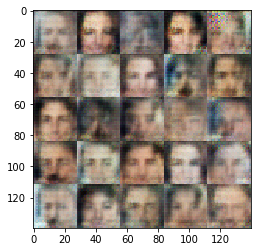

Epoch 1/1... Discriminator Loss: 0.0102... Generator Loss: 5.7855
Epoch 1/1... Discriminator Loss: 0.0006... Generator Loss: 10.5518
Epoch 1/1... Discriminator Loss: 0.1825... Generator Loss: 12.0511
Epoch 1/1... Discriminator Loss: 0.0010... Generator Loss: 12.4360
Epoch 1/1... Discriminator Loss: 0.0030... Generator Loss: 7.1702


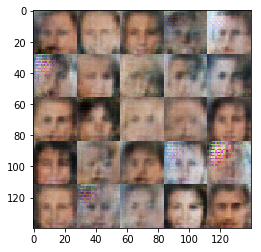

Epoch 1/1... Discriminator Loss: 0.0371... Generator Loss: 4.0113
Epoch 1/1... Discriminator Loss: 0.0064... Generator Loss: 6.2026
Epoch 1/1... Discriminator Loss: 2.2354... Generator Loss: 0.2650
Epoch 1/1... Discriminator Loss: 0.0145... Generator Loss: 11.3047
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 8.2612


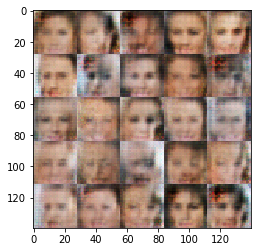

Epoch 1/1... Discriminator Loss: 0.0040... Generator Loss: 8.5318
Epoch 1/1... Discriminator Loss: 0.0061... Generator Loss: 10.1757
Epoch 1/1... Discriminator Loss: 0.0059... Generator Loss: 15.5326
Epoch 1/1... Discriminator Loss: 0.0008... Generator Loss: 11.5349
Epoch 1/1... Discriminator Loss: 0.0012... Generator Loss: 10.0990


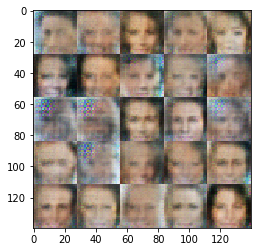

Epoch 1/1... Discriminator Loss: 0.0004... Generator Loss: 9.6286
Epoch 1/1... Discriminator Loss: 0.0027... Generator Loss: 7.1703
Epoch 1/1... Discriminator Loss: 0.1463... Generator Loss: 2.3459


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.